# 🎵 Music Genre Clustering menggunakan Dataset Spotify

---

## 📋 Daftar Isi
1. **Pendahuluan** - Apa itu Clustering?
2. **Import Library** - Persiapan tools yang dibutuhkan
3. **Load & Eksplorasi Data** - Memahami data kita
4. **Data Preprocessing** - Membersihkan dan menyiapkan data
5. **Exploratory Data Analysis (EDA)** - Visualisasi dan analisis mendalam
6. **Feature Engineering** - Memilih fitur terbaik untuk clustering
7. **Modeling - Clustering**
   - K-Means Clustering
   - DBSCAN
   - Hierarchical Clustering
   - Gaussian Mixture Model (GMM)
8. **Evaluasi & Perbandingan Model**
9. **Analisis Hasil Cluster**
10. **Kesimpulan & Rekomendasi**

---

## 🎯 Tujuan Project
Mengelompokkan lagu-lagu berdasarkan karakteristik audio mereka (seperti danceability, energy, tempo, dll.) menggunakan berbagai algoritma clustering, kemudian membandingkan hasilnya.

## 1. 📚 Pendahuluan - Apa itu Clustering?

### Apa itu Clustering?
**Clustering** adalah teknik Machine Learning yang mengelompokkan data berdasarkan kemiripan karakteristiknya, TANPA perlu label sebelumnya (unsupervised learning).

### Analogi Sederhana:
Bayangkan kamu punya 1000 lagu di playlist. Clustering akan membantu mengelompokkan lagu-lagu tersebut menjadi grup-grup berdasarkan "rasa" musiknya - misalnya:
- 🎸 Lagu-lagu energik untuk workout
- 🌙 Lagu-lagu santai untuk tidur
- 💃 Lagu-lagu yang enak untuk joget

### Algoritma yang akan kita bandingkan:

| Algoritma | Cara Kerja | Kelebihan | Kekurangan |
|-----------|------------|-----------|------------|
| **K-Means** | Membagi data ke K cluster dengan mencari titik pusat optimal | Cepat, mudah dipahami | Harus tentukan K, sensitif outlier |
| **DBSCAN** | Mengelompokkan data yang "rapat" berdekatan | Bisa temukan bentuk cluster bebas, deteksi outlier | Sulit di data berdimensi tinggi |
| **Hierarchical** | Membuat "pohon" cluster dari bawah ke atas | Tidak perlu tentukan K di awal | Lambat untuk data besar |
| **GMM** | Menggunakan distribusi probabilitas Gaussian | Lebih fleksibel, soft clustering | Lebih kompleks |

## 2. 📦 Import Library

Mari kita import semua library yang diperlukan untuk analisis ini.

In [1]:
# =====================================================
# IMPORT LIBRARY
# =====================================================

# Library untuk manipulasi data
import pandas as pd
import numpy as np

# Library untuk visualisasi
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Library untuk preprocessing
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA

# Library untuk clustering
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.mixture import GaussianMixture

# Library untuk evaluasi
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Library tambahan
import warnings
warnings.filterwarnings('ignore')

# Setting tampilan
pd.set_option('display.max_columns', None)
plt.style.use('seaborn-v0_8-whitegrid')

print("✅ Semua library berhasil di-import!")
print("📊 Siap untuk analisis clustering!")

✅ Semua library berhasil di-import!
📊 Siap untuk analisis clustering!


## 3. 📂 Load & Eksplorasi Data

Pertama, mari kita muat data dan lihat seperti apa bentuknya.

In [2]:
# Load dataset
df = pd.read_csv('dataset.csv')

# Tampilkan informasi dasar
print("="*60)
print("📊 INFORMASI DATASET SPOTIFY")
print("="*60)
print(f"\n🎵 Jumlah lagu: {df.shape[0]:,}")
print(f"📋 Jumlah kolom/fitur: {df.shape[1]}")

# Tampilkan 5 data pertama
print("\n📝 Preview 5 data pertama:")
df.head()

📊 INFORMASI DATASET SPOTIFY

🎵 Jumlah lagu: 114,000
📋 Jumlah kolom/fitur: 21

📝 Preview 5 data pertama:


,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [3]:
# Lihat informasi tipe data dan memory usage
print("📋 INFORMASI TIPE DATA:")
print("="*60)
df.info()

📋 INFORMASI TIPE DATA:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        114000 non-null  int64  
 1   track_id          114000 non-null  object 
 2   artists           113999 non-null  object 
 3   album_name        113999 non-null  object 
 4   track_name        113999 non-null  object 
 5   popularity        114000 non-null  int64  
 6   duration_ms       114000 non-null  int64  
 7   explicit          114000 non-null  bool   
 8   danceability      114000 non-null  float64
 9   energy            114000 non-null  float64
 10  key               114000 non-null  int64  
 11  loudness          114000 non-null  float64
 12  mode              114000 non-null  int64  
 13  speechiness       114000 non-null  float64
 14  acousticness      114000 non-null  float64
 15  instrumentalness  114000 non-null  float64
 1

In [4]:
# Lihat statistik deskriptif
print("📈 STATISTIK DESKRIPTIF:")
print("="*60)
df.describe().T

📈 STATISTIK DESKRIPTIF:


,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,114000.0,56999.500000,32909.109681,0.000,28499.75000,56999.500000,85499.2500,113999.000
popularity,114000.0,33.238535,22.305078,0.000,17.00000,35.000000,50.0000,100.000
duration_ms,114000.0,228029.153114,107297.712645,0.000,174066.00000,212906.000000,261506.0000,5237295.000
danceability,114000.0,0.566800,0.173542,0.000,0.45600,0.580000,0.6950,0.985
energy,114000.0,0.641383,0.251529,0.000,0.47200,0.685000,0.8540,1.000
key,114000.0,5.309140,3.559987,0.000,2.00000,5.000000,8.0000,11.000
loudness,114000.0,-8.258960,5.029337,-49.531,-10.01300,-7.004000,-5.0030,4.532
mode,114000.0,0.637553,0.480709,0.000,0.00000,1.000000,1.0000,1.000
speechiness,114000.0,0.084652,0.105732,0.000,0.03590,0.048900,0.0845,0.965
acousticness,114000.0,0.314910,0.332523,0.000,0.01690,0.169000,0.5980,0.996


### 🎼 Penjelasan Fitur Audio Spotify

| Fitur | Rentang | Penjelasan |
|-------|---------|------------|
| **danceability** | 0-1 | Seberapa cocok lagu untuk menari (1 = sangat cocok) |
| **energy** | 0-1 | Intensitas dan aktivitas lagu (1 = sangat energik) |
| **loudness** | -60 to 0 dB | Volume rata-rata dalam desibel |
| **speechiness** | 0-1 | Kehadiran kata-kata yang diucapkan (>0.66 = seperti podcast) |
| **acousticness** | 0-1 | Seberapa akustik lagunya (1 = sangat akustik) |
| **instrumentalness** | 0-1 | Prediksi lagu tanpa vokal (>0.5 = instrumental) |
| **liveness** | 0-1 | Kehadiran penonton dalam rekaman |
| **valence** | 0-1 | Positivitas musik (1 = ceria, 0 = sedih) |
| **tempo** | BPM | Kecepatan lagu dalam beat per minute |
| **popularity** | 0-100 | Popularitas lagu di Spotify |

In [5]:
# Lihat nama-nama kolom
print("📋 DAFTAR KOLOM:")
print("="*60)
for i, col in enumerate(df.columns, 1):
    print(f"{i:2}. {col}")

# Lihat distribusi genre
print(f"\n🎸 JUMLAH GENRE UNIK: {df['track_genre'].nunique()}")
print("\n📊 Top 10 Genre dengan lagu terbanyak:")
df['track_genre'].value_counts().head(10)

📋 DAFTAR KOLOM:
 1. Unnamed: 0
 2. track_id
 3. artists
 4. album_name
 5. track_name
 6. popularity
 7. duration_ms
 8. explicit
 9. danceability
10. energy
11. key
12. loudness
13. mode
14. speechiness
15. acousticness
16. instrumentalness
17. liveness
18. valence
19. tempo
20. time_signature
21. track_genre

🎸 JUMLAH GENRE UNIK: 114

📊 Top 10 Genre dengan lagu terbanyak:


track_genre
acoustic       1000
afrobeat       1000
alt-rock       1000
alternative    1000
ambient        1000
anime          1000
black-metal    1000
bluegrass      1000
blues          1000
brazil         1000
Name: count, dtype: int64

## 4. 🧹 Data Preprocessing

Sebelum clustering, kita perlu membersihkan dan menyiapkan data.

In [6]:
# =====================================================
# 4.1 CEK MISSING VALUES (DATA KOSONG)
# =====================================================

print("🔍 MENGECEK MISSING VALUES:")
print("="*60)

missing = df.isnull().sum()
missing_pct = (missing / len(df) * 100).round(2)

missing_df = pd.DataFrame({
    'Kolom': missing.index,
    'Jumlah Missing': missing.values,
    'Persentase (%)': missing_pct.values
})

# Filter hanya yang ada missing
missing_df = missing_df[missing_df['Jumlah Missing'] > 0]

if len(missing_df) == 0:
    print("✅ Tidak ada missing values! Data sudah bersih.")
else:
    print(missing_df)
    print(f"\n⚠️ Ada {len(missing_df)} kolom dengan missing values")

🔍 MENGECEK MISSING VALUES:
        Kolom  Jumlah Missing  Persentase (%)
2     artists               1             0.0
3  album_name               1             0.0
4  track_name               1             0.0

⚠️ Ada 3 kolom dengan missing values


In [7]:
# =====================================================
# 4.2 CEK DATA DUPLIKAT
# =====================================================

print("🔍 MENGECEK DATA DUPLIKAT:")
print("="*60)

# Cek duplikat berdasarkan track_id
duplicates_track = df['track_id'].duplicated().sum()
print(f"📌 Duplikat berdasarkan track_id: {duplicates_track:,}")

# Cek duplikat berdasarkan kombinasi artist + track_name
df['artist_track'] = df['artists'].astype(str) + ' - ' + df['track_name'].astype(str)
duplicates_combo = df['artist_track'].duplicated().sum()
print(f"📌 Duplikat berdasarkan Artist + Track Name: {duplicates_combo:,}")

# Hapus kolom temporary
df.drop('artist_track', axis=1, inplace=True)

🔍 MENGECEK DATA DUPLIKAT:
📌 Duplikat berdasarkan track_id: 24,259
📌 Duplikat berdasarkan Artist + Track Name: 32,656
📌 Duplikat berdasarkan track_id: 24,259
📌 Duplikat berdasarkan Artist + Track Name: 32,656


In [8]:
# =====================================================
# 4.3 PILIH FITUR NUMERIK UNTUK CLUSTERING
# =====================================================

# Fitur audio yang akan digunakan untuk clustering
audio_features = [
    'danceability',      # Seberapa cocok untuk menari
    'energy',            # Intensitas dan aktivitas
    'loudness',          # Volume
    'speechiness',       # Kehadiran kata-kata
    'acousticness',      # Seberapa akustik
    'instrumentalness',  # Tanpa vokal
    'liveness',          # Kehadiran live audience
    'valence',           # Positivitas/kegembiraan
    'tempo'              # Kecepatan (BPM)
]

print("🎵 FITUR AUDIO YANG DIGUNAKAN UNTUK CLUSTERING:")
print("="*60)
for i, feat in enumerate(audio_features, 1):
    print(f"  {i}. {feat}")

# Buat dataframe khusus untuk clustering
df_cluster = df[audio_features].copy()

print(f"\n📊 Shape data untuk clustering: {df_cluster.shape}")
df_cluster.head()

🎵 FITUR AUDIO YANG DIGUNAKAN UNTUK CLUSTERING:
  1. danceability
  2. energy
  3. loudness
  4. speechiness
  5. acousticness
  6. instrumentalness
  7. liveness
  8. valence
  9. tempo

📊 Shape data untuk clustering: (114000, 9)


,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,tempo
0,0.676,0.4610,-6.746,0.1430,0.0322,0.000001,0.3580,0.715,87.917
1,0.420,0.1660,-17.235,0.0763,0.9240,0.000006,0.1010,0.267,77.489
2,0.438,0.3590,-9.734,0.0557,0.2100,0.000000,0.1170,0.120,76.332
3,0.266,0.0596,-18.515,0.0363,0.9050,0.000071,0.1320,0.143,181.740
4,0.618,0.4430,-9.681,0.0526,0.4690,0.000000,0.0829,0.167,119.949


In [9]:
# =====================================================
# 4.4 SAMPLING DATA (untuk efisiensi komputasi)
# =====================================================

# Dataset sangat besar (100k+ rows), kita ambil sample untuk clustering
# Ini umum dilakukan dalam praktik machine learning

SAMPLE_SIZE = 20000  # Ambil 20,000 lagu sebagai sample
RANDOM_STATE = 42    # Untuk reproducibility

# Sampling dengan stratified berdasarkan genre (agar seimbang)
print("🎲 SAMPLING DATA:")
print("="*60)
print(f"📌 Data asli: {len(df):,} lagu")

# Sample data
df_sampled = df.sample(n=SAMPLE_SIZE, random_state=RANDOM_STATE)
print(f"📌 Data setelah sampling: {len(df_sampled):,} lagu")

# Update df_cluster dengan sample
df_cluster = df_sampled[audio_features].copy()

print(f"\n✅ Data siap untuk analisis!")

🎲 SAMPLING DATA:
📌 Data asli: 114,000 lagu
📌 Data setelah sampling: 20,000 lagu

✅ Data siap untuk analisis!


In [10]:
# =====================================================
# 4.5 STANDARDISASI DATA
# =====================================================

"""
MENGAPA PERLU STANDARDISASI?
============================
Fitur-fitur kita punya skala berbeda:
- danceability: 0-1
- tempo: 0-250+ (BPM)
- loudness: -60 to 0 (dB)

Tanpa standardisasi, fitur dengan nilai besar (tempo) akan mendominasi
clustering, padahal fitur dengan nilai kecil (danceability) juga penting.

StandardScaler mengubah semua fitur menjadi:
- Mean = 0
- Standard Deviation = 1
"""

print("⚖️ STANDARDISASI DATA:")
print("="*60)

# Inisialisasi scaler
scaler = StandardScaler()

# Fit dan transform
df_scaled = pd.DataFrame(
    scaler.fit_transform(df_cluster),
    columns=audio_features,
    index=df_cluster.index
)

print("📊 Perbandingan sebelum dan sesudah standardisasi:\n")

comparison = pd.DataFrame({
    'Fitur': audio_features,
    'Mean (Sebelum)': df_cluster.mean().round(3).values,
    'Std (Sebelum)': df_cluster.std().round(3).values,
    'Mean (Sesudah)': df_scaled.mean().round(6).values,
    'Std (Sesudah)': df_scaled.std().round(3).values
})
print(comparison.to_string(index=False))

print("\n✅ Data berhasil di-standardisasi!")

⚖️ STANDARDISASI DATA:
📊 Perbandingan sebelum dan sesudah standardisasi:

           Fitur  Mean (Sebelum)  Std (Sebelum)  Mean (Sesudah)  Std (Sesudah)
    danceability           0.566          0.174            -0.0            1.0
          energy           0.642          0.251             0.0            1.0
        loudness          -8.233          4.971            -0.0            1.0
     speechiness           0.085          0.106            -0.0            1.0
    acousticness           0.315          0.333             0.0            1.0
instrumentalness           0.153          0.306             0.0            1.0
        liveness           0.215          0.191            -0.0            1.0
         valence           0.474          0.261             0.0            1.0
           tempo         122.314         30.108             0.0            1.0

✅ Data berhasil di-standardisasi!


## 5. 📊 Exploratory Data Analysis (EDA)

Mari kita visualisasi data untuk memahami pola dan distribusi fitur.

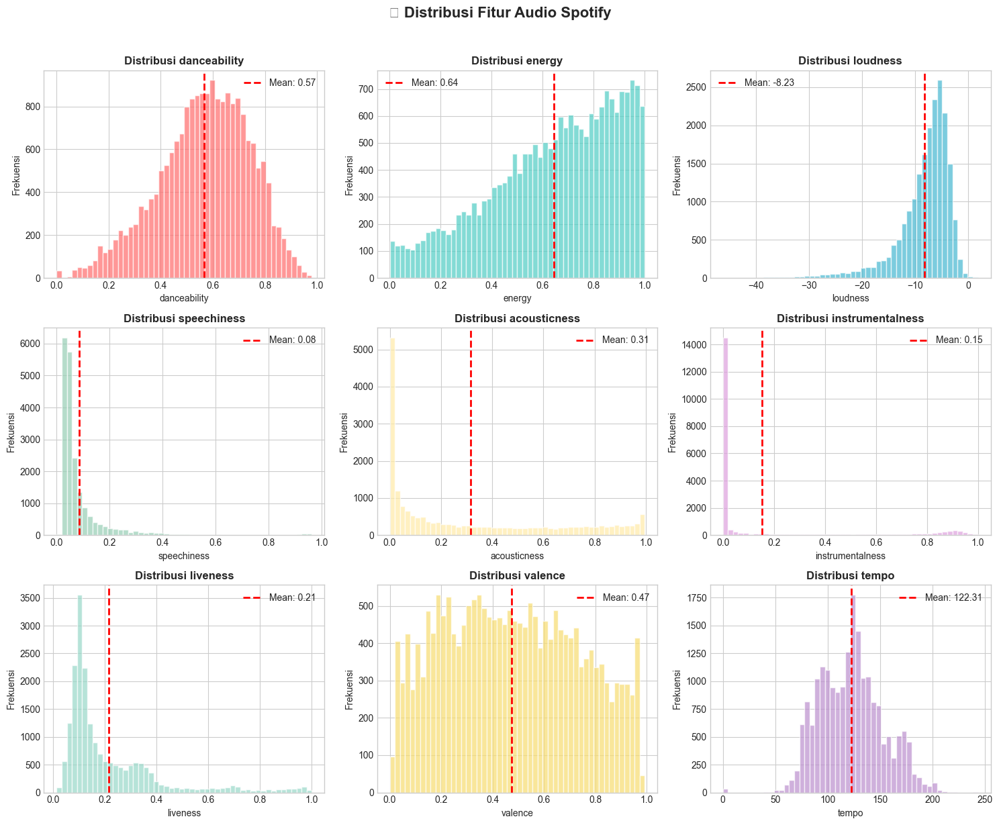

In [11]:
# =====================================================
# 5.1 DISTRIBUSI SETIAP FITUR
# =====================================================

fig, axes = plt.subplots(3, 3, figsize=(15, 12))
axes = axes.flatten()

colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4', '#FFEAA7', 
          '#DDA0DD', '#98D8C8', '#F7DC6F', '#BB8FCE']

for i, (col, color) in enumerate(zip(audio_features, colors)):
    ax = axes[i]
    ax.hist(df_cluster[col], bins=50, color=color, edgecolor='white', alpha=0.7)
    ax.set_title(f'Distribusi {col}', fontsize=12, fontweight='bold')
    ax.set_xlabel(col)
    ax.set_ylabel('Frekuensi')
    
    # Tambah garis mean
    mean_val = df_cluster[col].mean()
    ax.axvline(mean_val, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_val:.2f}')
    ax.legend()

plt.suptitle('📊 Distribusi Fitur Audio Spotify', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

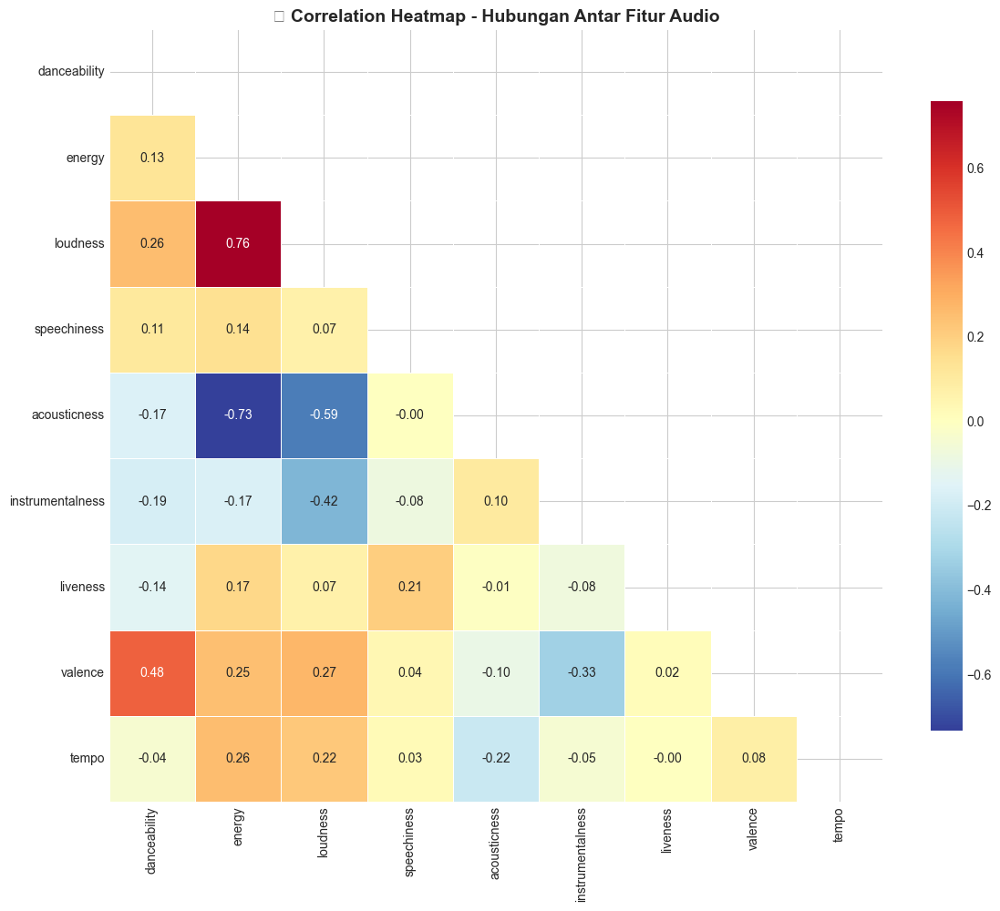


💡 INSIGHT KORELASI:
📌 Energy & Loudness: Korelasi positif tinggi (lagu energik cenderung lebih keras)
📌 Energy & Acousticness: Korelasi negatif (lagu akustik cenderung tidak terlalu energik)
📌 Danceability & Valence: Korelasi positif (lagu yang enak untuk joget cenderung lebih ceria)


In [12]:
# =====================================================
# 5.2 CORRELATION HEATMAP
# =====================================================

"""
CORRELATION HEATMAP
===================
Menunjukkan hubungan antar fitur:
- Nilai mendekati 1: Korelasi positif kuat (keduanya naik bersamaan)
- Nilai mendekati -1: Korelasi negatif kuat (satu naik, satu turun)
- Nilai mendekati 0: Tidak ada korelasi
"""

plt.figure(figsize=(12, 10))

# Hitung korelasi
corr_matrix = df_cluster.corr()

# Buat heatmap
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))  # Upper triangle mask
sns.heatmap(
    corr_matrix, 
    annot=True, 
    fmt='.2f', 
    cmap='RdYlBu_r',
    center=0,
    mask=mask,
    square=True,
    linewidths=0.5,
    cbar_kws={'shrink': 0.8}
)

plt.title('🔥 Correlation Heatmap - Hubungan Antar Fitur Audio', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

# Insight korelasi
print("\n💡 INSIGHT KORELASI:")
print("="*60)
print("📌 Energy & Loudness: Korelasi positif tinggi (lagu energik cenderung lebih keras)")
print("📌 Energy & Acousticness: Korelasi negatif (lagu akustik cenderung tidak terlalu energik)")
print("📌 Danceability & Valence: Korelasi positif (lagu yang enak untuk joget cenderung lebih ceria)")

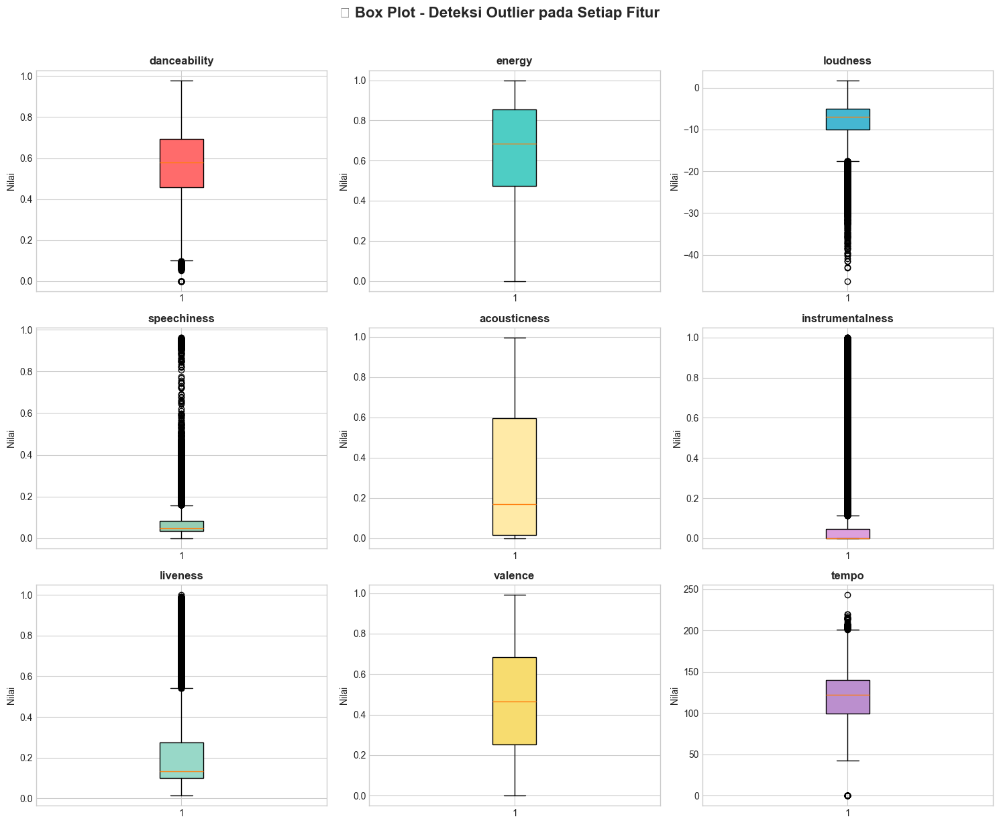


💡 INTERPRETASI BOX PLOT:
📌 Titik-titik di luar 'kumis' adalah outlier (nilai ekstrem)
📌 Kotak menunjukkan 50% data tengah (Q1 sampai Q3)
📌 Garis di tengah kotak adalah median


In [13]:
# =====================================================
# 5.3 BOX PLOT - DETEKSI OUTLIER
# =====================================================

fig, axes = plt.subplots(3, 3, figsize=(15, 12))
axes = axes.flatten()

for i, col in enumerate(audio_features):
    ax = axes[i]
    box = ax.boxplot(df_cluster[col], patch_artist=True)
    box['boxes'][0].set_facecolor(colors[i])
    ax.set_title(f'{col}', fontsize=12, fontweight='bold')
    ax.set_ylabel('Nilai')

plt.suptitle('📦 Box Plot - Deteksi Outlier pada Setiap Fitur', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

print("\n💡 INTERPRETASI BOX PLOT:")
print("="*60)
print("📌 Titik-titik di luar 'kumis' adalah outlier (nilai ekstrem)")
print("📌 Kotak menunjukkan 50% data tengah (Q1 sampai Q3)")
print("📌 Garis di tengah kotak adalah median")

🔍 Membuat Pairplot untuk 4 fitur utama...
   (danceability, energy, valence, acousticness)


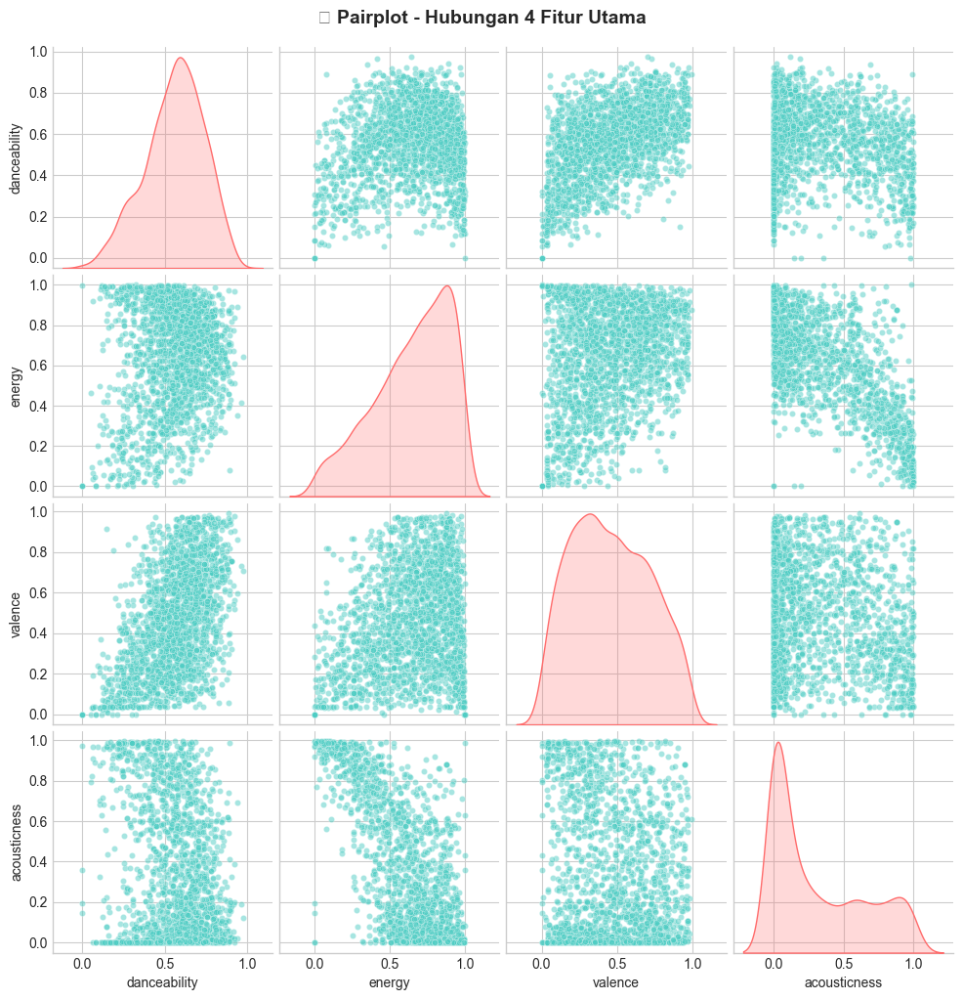

In [14]:
# =====================================================
# 5.4 PAIRPLOT - HUBUNGAN ANTAR FITUR (SAMPLE KECIL)
# =====================================================

# Ambil sample kecil untuk pairplot (karena computationally expensive)
sample_for_plot = df_cluster.sample(n=2000, random_state=42)

# Pilih 4 fitur paling penting untuk visualisasi
key_features = ['danceability', 'energy', 'valence', 'acousticness']

print("🔍 Membuat Pairplot untuk 4 fitur utama...")
print("   (danceability, energy, valence, acousticness)")

g = sns.pairplot(sample_for_plot[key_features], diag_kind='kde', 
                 plot_kws={'alpha': 0.5, 's': 20, 'color': '#4ECDC4'},
                 diag_kws={'color': '#FF6B6B'})
g.fig.suptitle('🎵 Pairplot - Hubungan 4 Fitur Utama', y=1.02, fontsize=14, fontweight='bold')
plt.show()

## 6. 🔬 Dimensionality Reduction dengan PCA

PCA (Principal Component Analysis) membantu kita:
1. Mengurangi dimensi data dari 9 fitur menjadi 2-3 komponen utama
2. Memvisualisasikan data dalam 2D/3D
3. Melihat pola clustering secara visual

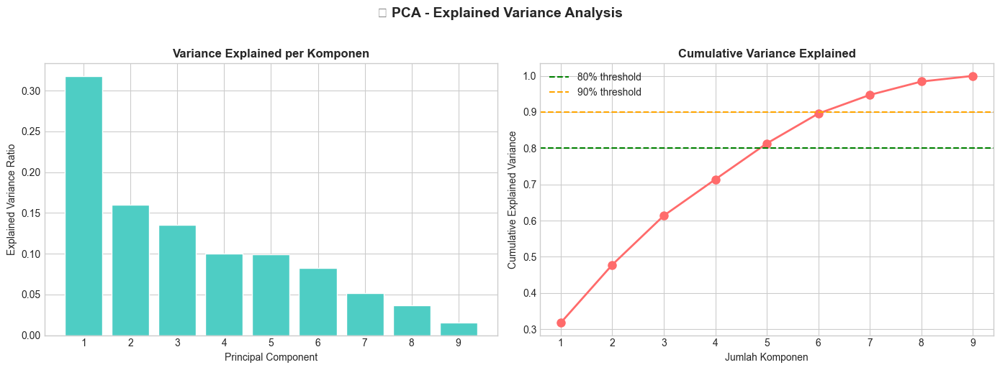


📊 EXPLAINED VARIANCE PER KOMPONEN:
PC1: 31.75% | Kumulatif: 31.75%
PC2: 16.04% | Kumulatif: 47.79%
PC3: 13.58% | Kumulatif: 61.37%
PC4: 10.03% | Kumulatif: 71.40%
PC5: 9.93% | Kumulatif: 81.33%
PC6: 8.26% | Kumulatif: 89.59%
PC7: 5.16% | Kumulatif: 94.74%
PC8: 3.70% | Kumulatif: 98.44%
PC9: 1.56% | Kumulatif: 100.00%


In [15]:
# =====================================================
# 6.1 APLIKASI PCA
# =====================================================

# PCA dengan semua komponen dulu untuk melihat variance explained
pca_full = PCA()
pca_full.fit(df_scaled)

# Visualisasi explained variance
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Plot 1: Variance Explained per komponen
ax1 = axes[0]
variance_ratio = pca_full.explained_variance_ratio_
ax1.bar(range(1, len(variance_ratio)+1), variance_ratio, color='#4ECDC4', edgecolor='white')
ax1.set_xlabel('Principal Component')
ax1.set_ylabel('Explained Variance Ratio')
ax1.set_title('Variance Explained per Komponen', fontweight='bold')
ax1.set_xticks(range(1, len(variance_ratio)+1))

# Plot 2: Cumulative Variance Explained
ax2 = axes[1]
cumulative_variance = np.cumsum(variance_ratio)
ax2.plot(range(1, len(cumulative_variance)+1), cumulative_variance, 'o-', color='#FF6B6B', linewidth=2, markersize=8)
ax2.axhline(y=0.8, color='green', linestyle='--', label='80% threshold')
ax2.axhline(y=0.9, color='orange', linestyle='--', label='90% threshold')
ax2.set_xlabel('Jumlah Komponen')
ax2.set_ylabel('Cumulative Explained Variance')
ax2.set_title('Cumulative Variance Explained', fontweight='bold')
ax2.legend()
ax2.set_xticks(range(1, len(cumulative_variance)+1))

plt.suptitle('📊 PCA - Explained Variance Analysis', fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# Tampilkan angka-angkanya
print("\n📊 EXPLAINED VARIANCE PER KOMPONEN:")
print("="*60)
for i, (var, cum_var) in enumerate(zip(variance_ratio, cumulative_variance), 1):
    print(f"PC{i}: {var*100:.2f}% | Kumulatif: {cum_var*100:.2f}%")

🔬 PCA 2D RESULTS:
📌 Shape sebelum PCA: (20000, 9)
📌 Shape sesudah PCA: (20000, 2)
📌 Total variance explained: 47.79%


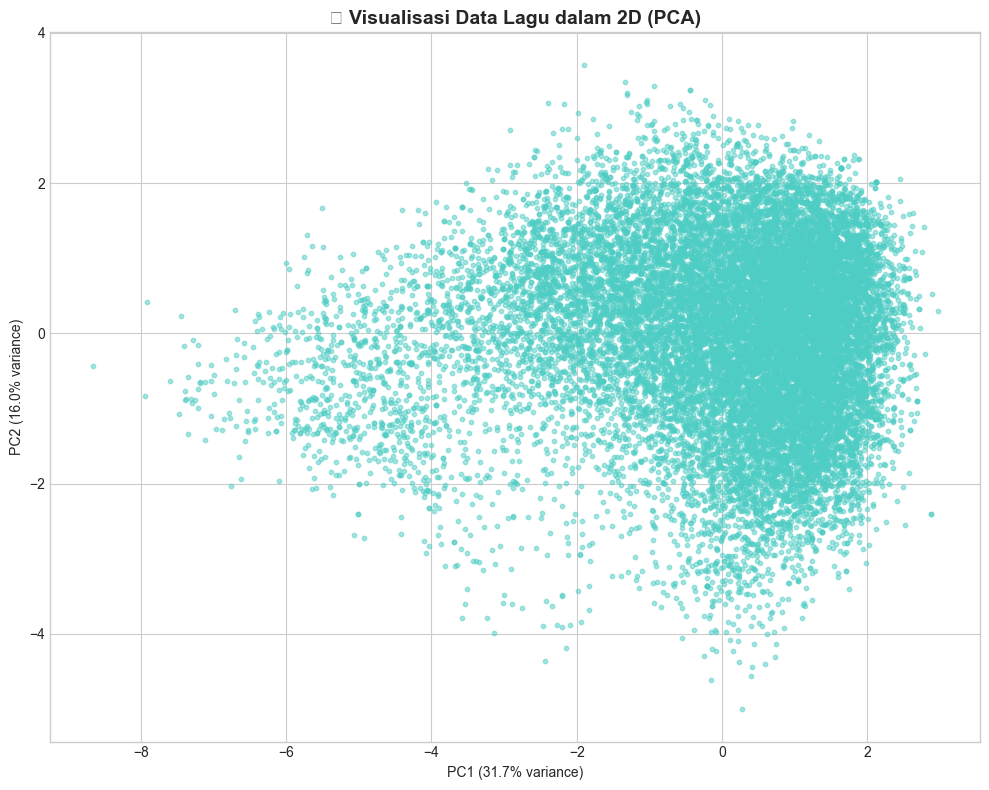

In [16]:
# =====================================================
# 6.2 REDUKSI KE 2 KOMPONEN UNTUK VISUALISASI
# =====================================================

# PCA dengan 2 komponen untuk visualisasi 2D
pca_2d = PCA(n_components=2)
df_pca_2d = pca_2d.fit_transform(df_scaled)

# Buat DataFrame
df_pca_2d = pd.DataFrame(df_pca_2d, columns=['PC1', 'PC2'], index=df_scaled.index)

print("🔬 PCA 2D RESULTS:")
print("="*60)
print(f"📌 Shape sebelum PCA: {df_scaled.shape}")
print(f"📌 Shape sesudah PCA: {df_pca_2d.shape}")
print(f"📌 Total variance explained: {sum(pca_2d.explained_variance_ratio_)*100:.2f}%")

# Visualisasi scatter plot
plt.figure(figsize=(10, 8))
plt.scatter(df_pca_2d['PC1'], df_pca_2d['PC2'], alpha=0.5, s=10, c='#4ECDC4')
plt.xlabel(f'PC1 ({pca_2d.explained_variance_ratio_[0]*100:.1f}% variance)')
plt.ylabel(f'PC2 ({pca_2d.explained_variance_ratio_[1]*100:.1f}% variance)')
plt.title('🎵 Visualisasi Data Lagu dalam 2D (PCA)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

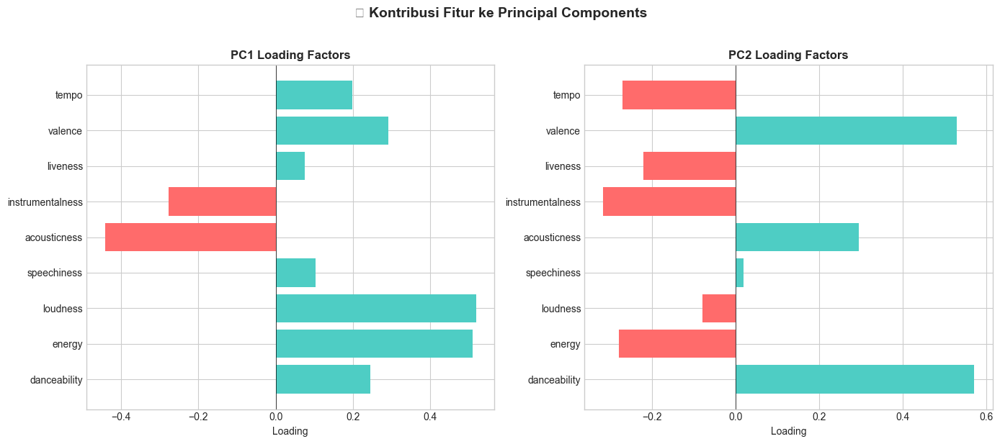


📊 LOADING FACTORS:
                    PC1    PC2
danceability      0.245  0.570
energy            0.509 -0.280
loudness          0.518 -0.079
speechiness       0.103  0.019
acousticness     -0.442  0.294
instrumentalness -0.277 -0.318
liveness          0.076 -0.222
valence           0.292  0.529
tempo             0.198 -0.272

💡 INTERPRETASI:
PC1: Fitur dengan nilai positif tinggi berkontribusi positif ke PC1
PC2: Fitur dengan nilai negatif tinggi berkontribusi negatif ke PC2


In [17]:
# =====================================================
# 6.3 LOADING FACTORS - KONTRIBUSI FITUR KE PC
# =====================================================

"""
LOADING FACTORS menunjukkan:
- Fitur mana yang paling berkontribusi ke setiap Principal Component
- Membantu interpretasi makna setiap PC
"""

# Buat dataframe loading factors
loadings = pd.DataFrame(
    pca_2d.components_.T,
    columns=['PC1', 'PC2'],
    index=audio_features
)

# Visualisasi
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# PC1 Loadings
ax1 = axes[0]
colors_pc1 = ['#FF6B6B' if x < 0 else '#4ECDC4' for x in loadings['PC1']]
ax1.barh(loadings.index, loadings['PC1'], color=colors_pc1)
ax1.set_xlabel('Loading')
ax1.set_title('PC1 Loading Factors', fontweight='bold')
ax1.axvline(x=0, color='black', linewidth=0.5)

# PC2 Loadings
ax2 = axes[1]
colors_pc2 = ['#FF6B6B' if x < 0 else '#4ECDC4' for x in loadings['PC2']]
ax2.barh(loadings.index, loadings['PC2'], color=colors_pc2)
ax2.set_xlabel('Loading')
ax2.set_title('PC2 Loading Factors', fontweight='bold')
ax2.axvline(x=0, color='black', linewidth=0.5)

plt.suptitle('🔍 Kontribusi Fitur ke Principal Components', fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# Tampilkan nilai loading
print("\n📊 LOADING FACTORS:")
print("="*60)
print(loadings.round(3))
print("\n💡 INTERPRETASI:")
print("PC1: Fitur dengan nilai positif tinggi berkontribusi positif ke PC1")
print("PC2: Fitur dengan nilai negatif tinggi berkontribusi negatif ke PC2")

---

## 7. 🎯 CLUSTERING ALGORITHMS

Sekarang kita akan menerapkan 4 algoritma clustering berbeda dan membandingkan hasilnya.

---

### 7.1 🎯 K-Means Clustering

#### Apa itu K-Means?
K-Means adalah algoritma yang membagi data menjadi K kelompok dengan cara:
1. Pilih K titik acak sebagai pusat cluster (centroid)
2. Hitung jarak setiap data ke semua centroid
3. Assign data ke centroid terdekat
4. Update posisi centroid ke rata-rata anggotanya
5. Ulangi sampai konvergen (centroid tidak berubah lagi)

🔍 Menjalankan Elbow Method untuk menentukan K optimal...
  K=2: Inertia=141497.81, Silhouette=0.2622
  K=2: Inertia=141497.81, Silhouette=0.2622
  K=3: Inertia=125551.89, Silhouette=0.1660
  K=3: Inertia=125551.89, Silhouette=0.1660
  K=4: Inertia=113442.98, Silhouette=0.1741
  K=4: Inertia=113442.98, Silhouette=0.1741
  K=5: Inertia=102613.99, Silhouette=0.1806
  K=5: Inertia=102613.99, Silhouette=0.1806
  K=6: Inertia=93793.44, Silhouette=0.1921
  K=6: Inertia=93793.44, Silhouette=0.1921
  K=7: Inertia=85208.18, Silhouette=0.1987
  K=7: Inertia=85208.18, Silhouette=0.1987
  K=8: Inertia=80245.96, Silhouette=0.1796
  K=8: Inertia=80245.96, Silhouette=0.1796
  K=9: Inertia=75930.32, Silhouette=0.1842
  K=9: Inertia=75930.32, Silhouette=0.1842
  K=10: Inertia=72663.79, Silhouette=0.1714
  K=10: Inertia=72663.79, Silhouette=0.1714


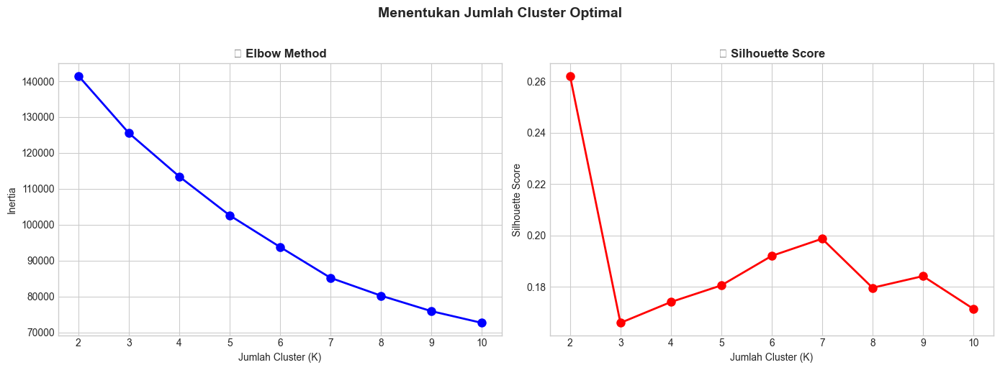


✅ REKOMENDASI:
📌 K optimal berdasarkan Silhouette Score: 2
📌 Silhouette Score tertinggi: 0.2622


In [18]:
# =====================================================
# 7.1.1 MENENTUKAN JUMLAH CLUSTER OPTIMAL (ELBOW METHOD)
# =====================================================

"""
ELBOW METHOD
============
Cara menentukan jumlah cluster optimal:
1. Jalankan K-Means dengan berbagai nilai K
2. Hitung inertia (total jarak dalam cluster) untuk setiap K
3. Plot dan cari "siku" (elbow) - titik di mana penurunan inertia mulai melambat
"""

print("🔍 Menjalankan Elbow Method untuk menentukan K optimal...")
print("="*60)

# Range K yang akan diuji
k_range = range(2, 11)
inertias = []
silhouette_scores = []

for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(df_scaled)
    inertias.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(df_scaled, kmeans.labels_))
    print(f"  K={k}: Inertia={kmeans.inertia_:.2f}, Silhouette={silhouette_scores[-1]:.4f}")

# Visualisasi
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Elbow Plot
ax1 = axes[0]
ax1.plot(k_range, inertias, 'bo-', linewidth=2, markersize=8)
ax1.set_xlabel('Jumlah Cluster (K)')
ax1.set_ylabel('Inertia')
ax1.set_title('🦵 Elbow Method', fontweight='bold')
ax1.set_xticks(k_range)

# Silhouette Score Plot
ax2 = axes[1]
ax2.plot(k_range, silhouette_scores, 'ro-', linewidth=2, markersize=8)
ax2.set_xlabel('Jumlah Cluster (K)')
ax2.set_ylabel('Silhouette Score')
ax2.set_title('📊 Silhouette Score', fontweight='bold')
ax2.set_xticks(k_range)

plt.suptitle('Menentukan Jumlah Cluster Optimal', fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# Rekomendasi
best_k_silhouette = k_range[np.argmax(silhouette_scores)]
print(f"\n✅ REKOMENDASI:")
print(f"📌 K optimal berdasarkan Silhouette Score: {best_k_silhouette}")
print(f"📌 Silhouette Score tertinggi: {max(silhouette_scores):.4f}")

In [19]:
# =====================================================
# 7.1.2 APLIKASI K-MEANS DENGAN K OPTIMAL
# =====================================================

# Gunakan K optimal berdasarkan Silhouette Score tertinggi dari analisis sebelumnya
OPTIMAL_K = best_k_silhouette

print(f"🎯 Menjalankan K-Means dengan K={OPTIMAL_K} (berdasarkan Silhouette Score terbaik)...")
print("="*60)

# Fit K-Means
kmeans = KMeans(n_clusters=OPTIMAL_K, random_state=42, n_init=10)
kmeans_labels = kmeans.fit_predict(df_scaled)

# Tambahkan label ke dataframe
df_sampled['kmeans_cluster'] = kmeans_labels
df_pca_2d['kmeans_cluster'] = kmeans_labels

# Evaluasi
kmeans_silhouette = silhouette_score(df_scaled, kmeans_labels)
kmeans_calinski = calinski_harabasz_score(df_scaled, kmeans_labels)
kmeans_davies = davies_bouldin_score(df_scaled, kmeans_labels)

print(f"\n📊 HASIL K-MEANS CLUSTERING:")
print(f"   • Silhouette Score: {kmeans_silhouette:.4f}")
print(f"   • Calinski-Harabasz Score: {kmeans_calinski:.2f}")
print(f"   • Davies-Bouldin Score: {kmeans_davies:.4f}")

# Distribusi cluster
print(f"\n📌 DISTRIBUSI ANGGOTA CLUSTER:")
cluster_dist = pd.Series(kmeans_labels).value_counts().sort_index()
for cluster, count in cluster_dist.items():
    pct = count / len(kmeans_labels) * 100
    print(f"   Cluster {cluster}: {count:,} lagu ({pct:.1f}%)")

🎯 Menjalankan K-Means dengan K=2 (berdasarkan Silhouette Score terbaik)...

📊 HASIL K-MEANS CLUSTERING:
   • Silhouette Score: 0.2622
   • Calinski-Harabasz Score: 5441.55
   • Davies-Bouldin Score: 1.5744

📌 DISTRIBUSI ANGGOTA CLUSTER:
   Cluster 0: 15,088 lagu (75.4%)
   Cluster 1: 4,912 lagu (24.6%)

📊 HASIL K-MEANS CLUSTERING:
   • Silhouette Score: 0.2622
   • Calinski-Harabasz Score: 5441.55
   • Davies-Bouldin Score: 1.5744

📌 DISTRIBUSI ANGGOTA CLUSTER:
   Cluster 0: 15,088 lagu (75.4%)
   Cluster 1: 4,912 lagu (24.6%)


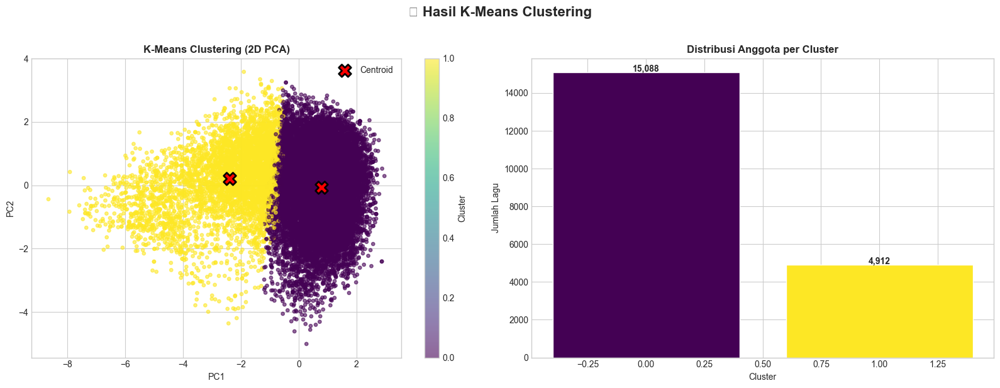

In [20]:
# =====================================================
# 7.1.3 VISUALISASI HASIL K-MEANS
# =====================================================

# Visualisasi dalam 2D (PCA)
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Scatter dengan cluster
ax1 = axes[0]
scatter = ax1.scatter(df_pca_2d['PC1'], df_pca_2d['PC2'], 
                      c=kmeans_labels, cmap='viridis', alpha=0.6, s=15)
ax1.set_xlabel('PC1')
ax1.set_ylabel('PC2')
ax1.set_title('K-Means Clustering (2D PCA)', fontweight='bold')
plt.colorbar(scatter, ax=ax1, label='Cluster')

# Tambahkan centroid (transformasi ke PCA space)
centroids_pca = pca_2d.transform(kmeans.cluster_centers_)
ax1.scatter(centroids_pca[:, 0], centroids_pca[:, 1], 
            c='red', marker='X', s=200, edgecolors='black', linewidths=2, label='Centroid')
ax1.legend()

# Plot 2: Distribusi cluster
ax2 = axes[1]
colors_bar = plt.cm.viridis(np.linspace(0, 1, OPTIMAL_K))
cluster_counts = pd.Series(kmeans_labels).value_counts().sort_index()
bars = ax2.bar(cluster_counts.index, cluster_counts.values, color=colors_bar, edgecolor='white')
ax2.set_xlabel('Cluster')
ax2.set_ylabel('Jumlah Lagu')
ax2.set_title('Distribusi Anggota per Cluster', fontweight='bold')

# Tambah label di atas bar
for bar, count in zip(bars, cluster_counts.values):
    ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 50, 
             f'{count:,}', ha='center', fontweight='bold')

plt.suptitle('🎯 Hasil K-Means Clustering', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

### 7.2 🔮 DBSCAN Clustering

#### Apa itu DBSCAN?
**DBSCAN** (Density-Based Spatial Clustering of Applications with Noise) mengelompokkan data berdasarkan kepadatan:
- **Core points**: Titik dengan banyak tetangga dalam radius tertentu
- **Border points**: Titik dekat core points tapi tidak punya cukup tetangga
- **Noise/Outlier**: Titik yang tidak masuk cluster manapun

#### Parameter Penting:
- `eps`: Radius pencarian tetangga
- `min_samples`: Minimum tetangga untuk jadi core point

🔍 Menentukan parameter eps optimal menggunakan K-distance graph...


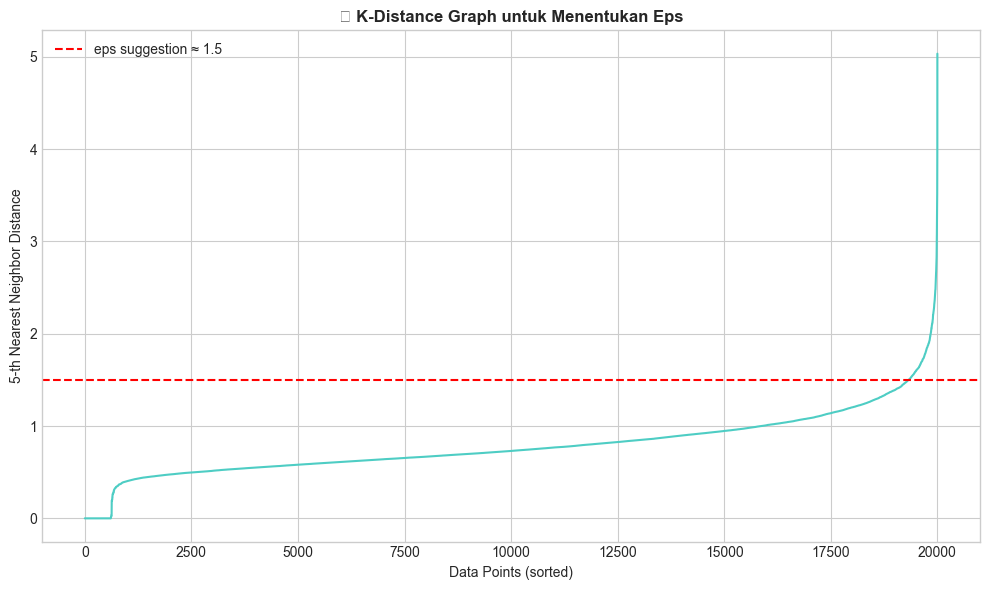


💡 Berdasarkan K-distance graph, kita pilih eps sekitar titik 'siku' grafik


In [21]:
# =====================================================
# 7.2.1 MENENTUKAN PARAMETER DBSCAN OPTIMAL
# =====================================================

from sklearn.neighbors import NearestNeighbors

"""
K-DISTANCE GRAPH untuk menentukan eps optimal:
- Hitung jarak ke k-nearest neighbor untuk setiap titik
- Plot jarak yang sudah diurutkan
- Cari "knee" di grafik - itu adalah eps optimal
"""

print("🔍 Menentukan parameter eps optimal menggunakan K-distance graph...")
print("="*60)

# Hitung k-nearest neighbors distance
k = 5  # min_samples yang akan kita gunakan
nn = NearestNeighbors(n_neighbors=k)
nn.fit(df_scaled)
distances, _ = nn.kneighbors(df_scaled)

# Ambil jarak ke neighbor ke-k dan urutkan
k_distances = np.sort(distances[:, k-1])

# Plot
plt.figure(figsize=(10, 6))
plt.plot(range(len(k_distances)), k_distances, color='#4ECDC4')
plt.xlabel('Data Points (sorted)')
plt.ylabel(f'{k}-th Nearest Neighbor Distance')
plt.title('🔍 K-Distance Graph untuk Menentukan Eps', fontweight='bold')
plt.axhline(y=1.5, color='red', linestyle='--', label='eps suggestion ≈ 1.5')
plt.legend()
plt.tight_layout()
plt.show()

print("\n💡 Berdasarkan K-distance graph, kita pilih eps sekitar titik 'siku' grafik")

In [22]:
# =====================================================
# 7.2.2 APLIKASI DBSCAN
# =====================================================

# Parameter DBSCAN
EPS = 1.5
MIN_SAMPLES = 5

print(f"🔮 Menjalankan DBSCAN dengan eps={EPS}, min_samples={MIN_SAMPLES}...")
print("="*60)

# Fit DBSCAN
dbscan = DBSCAN(eps=EPS, min_samples=MIN_SAMPLES)
dbscan_labels = dbscan.fit_predict(df_scaled)

# Tambahkan label ke dataframe
df_sampled['dbscan_cluster'] = dbscan_labels
df_pca_2d['dbscan_cluster'] = dbscan_labels

# Hitung statistik
n_clusters_dbscan = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)
n_noise = (dbscan_labels == -1).sum()

print(f"\n📊 HASIL DBSCAN CLUSTERING:")
print(f"   • Jumlah Cluster: {n_clusters_dbscan}")
print(f"   • Jumlah Noise/Outlier: {n_noise:,} ({n_noise/len(dbscan_labels)*100:.1f}%)")

# Evaluasi (hanya jika ada lebih dari 1 cluster dan tidak semua noise)
if n_clusters_dbscan > 1:
    # Filter out noise untuk evaluasi
    mask = dbscan_labels != -1
    if mask.sum() > n_clusters_dbscan:
        dbscan_silhouette = silhouette_score(df_scaled[mask], dbscan_labels[mask])
        print(f"   • Silhouette Score (tanpa noise): {dbscan_silhouette:.4f}")

# Distribusi cluster
print(f"\n📌 DISTRIBUSI ANGGOTA CLUSTER:")
cluster_dist = pd.Series(dbscan_labels).value_counts().sort_index()
for cluster, count in cluster_dist.items():
    pct = count / len(dbscan_labels) * 100
    label = "Noise/Outlier" if cluster == -1 else f"Cluster {cluster}"
    print(f"   {label}: {count:,} lagu ({pct:.1f}%)")

🔮 Menjalankan DBSCAN dengan eps=1.5, min_samples=5...

📊 HASIL DBSCAN CLUSTERING:
   • Jumlah Cluster: 4
   • Jumlah Noise/Outlier: 338 (1.7%)

📊 HASIL DBSCAN CLUSTERING:
   • Jumlah Cluster: 4
   • Jumlah Noise/Outlier: 338 (1.7%)
   • Silhouette Score (tanpa noise): 0.3962

📌 DISTRIBUSI ANGGOTA CLUSTER:
   Noise/Outlier: 338 lagu (1.7%)
   Cluster 0: 19,521 lagu (97.6%)
   Cluster 1: 122 lagu (0.6%)
   Cluster 2: 12 lagu (0.1%)
   Cluster 3: 7 lagu (0.0%)
   • Silhouette Score (tanpa noise): 0.3962

📌 DISTRIBUSI ANGGOTA CLUSTER:
   Noise/Outlier: 338 lagu (1.7%)
   Cluster 0: 19,521 lagu (97.6%)
   Cluster 1: 122 lagu (0.6%)
   Cluster 2: 12 lagu (0.1%)
   Cluster 3: 7 lagu (0.0%)


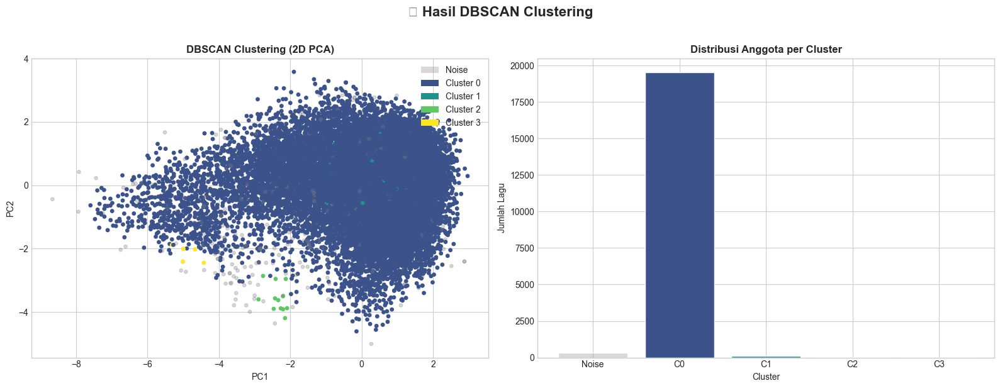

In [23]:
# =====================================================
# 7.2.3 VISUALISASI HASIL DBSCAN
# =====================================================

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Scatter dengan cluster
ax1 = axes[0]

# Buat colormap khusus (noise = abu-abu)
unique_labels = set(dbscan_labels)
colors_dbscan = plt.cm.viridis(np.linspace(0, 1, len(unique_labels)))
color_map = {label: colors_dbscan[i] for i, label in enumerate(sorted(unique_labels))}
color_map[-1] = [0.5, 0.5, 0.5, 0.3]  # Noise jadi abu-abu transparan

point_colors = [color_map[label] for label in dbscan_labels]

scatter = ax1.scatter(df_pca_2d['PC1'], df_pca_2d['PC2'], 
                      c=point_colors, s=15)
ax1.set_xlabel('PC1')
ax1.set_ylabel('PC2')
ax1.set_title('DBSCAN Clustering (2D PCA)', fontweight='bold')

# Legend manual
from matplotlib.patches import Patch
legend_elements = []
for label in sorted(unique_labels):
    if label == -1:
        legend_elements.append(Patch(facecolor='gray', alpha=0.3, label='Noise'))
    else:
        legend_elements.append(Patch(facecolor=color_map[label], label=f'Cluster {label}'))
ax1.legend(handles=legend_elements, loc='upper right')

# Plot 2: Distribusi cluster
ax2 = axes[1]
cluster_counts = pd.Series(dbscan_labels).value_counts().sort_index()
bar_colors = [color_map[label] for label in cluster_counts.index]
bars = ax2.bar(range(len(cluster_counts)), cluster_counts.values, color=bar_colors, edgecolor='white')
ax2.set_xticks(range(len(cluster_counts)))
ax2.set_xticklabels(['Noise' if x == -1 else f'C{x}' for x in cluster_counts.index])
ax2.set_xlabel('Cluster')
ax2.set_ylabel('Jumlah Lagu')
ax2.set_title('Distribusi Anggota per Cluster', fontweight='bold')

plt.suptitle('🔮 Hasil DBSCAN Clustering', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

### 7.3 🌳 Hierarchical Clustering (Agglomerative)

#### Apa itu Hierarchical Clustering?
Algoritma yang membangun "pohon" cluster dengan cara:
1. **Mulai**: Setiap data adalah cluster sendiri
2. **Gabung**: Cluster terdekat digabung menjadi satu
3. **Ulangi**: Terus gabung sampai tersisa 1 cluster
4. **Potong**: Pilih di level mana pohon dipotong untuk dapat K cluster

#### Linkage Methods:
- **Ward**: Meminimalkan variance dalam cluster
- **Complete**: Jarak cluster = jarak maksimum antar anggota
- **Average**: Jarak cluster = rata-rata jarak antar anggota

🌳 Membuat Dendrogram...


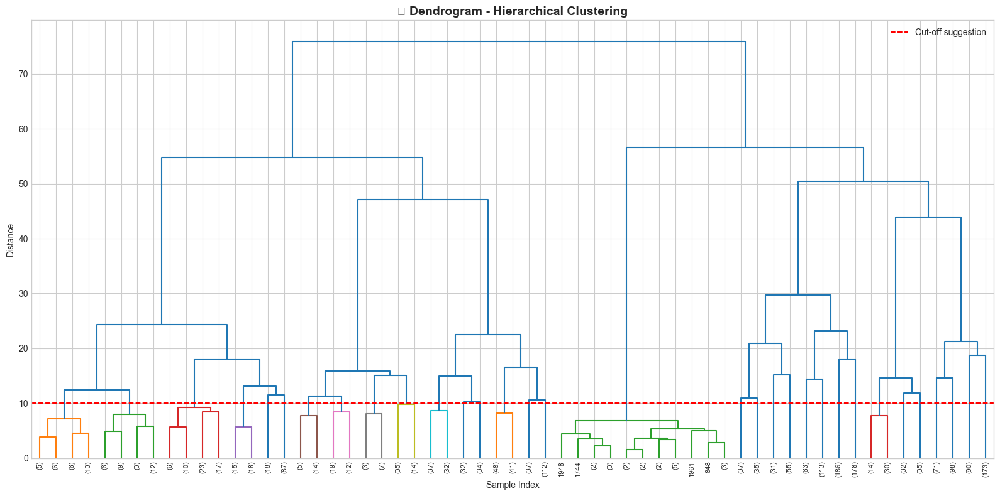


💡 Garis horizontal merah menunjukkan di mana kita bisa 'memotong' pohon
   untuk mendapatkan cluster yang terpisah dengan baik


In [24]:
# =====================================================
# 7.3.1 VISUALISASI DENDROGRAM
# =====================================================

from scipy.cluster.hierarchy import dendrogram, linkage

"""
DENDROGRAM
==========
Visualisasi "pohon" clustering:
- Sumbu Y = jarak/ketidakmiripan
- Garis horizontal = penggabungan cluster
- Semakin tinggi garis, semakin berbeda clusternya
"""

print("🌳 Membuat Dendrogram...")
print("="*60)

# Ambil sample kecil untuk dendrogram (karena computational expensive)
sample_size_dendro = 2000
sample_idx = np.random.choice(len(df_scaled), sample_size_dendro, replace=False)
df_scaled_sample = df_scaled.iloc[sample_idx]

# Hitung linkage
linked = linkage(df_scaled_sample, method='ward')

# Plot dendrogram
plt.figure(figsize=(16, 8))
dendrogram(
    linked,
    truncate_mode='level',
    p=5,  # Tampilkan hanya 5 level teratas
    leaf_rotation=90,
    leaf_font_size=8,
    color_threshold=10
)
plt.xlabel('Sample Index')
plt.ylabel('Distance')
plt.title('🌳 Dendrogram - Hierarchical Clustering', fontsize=14, fontweight='bold')
plt.axhline(y=10, color='r', linestyle='--', label='Cut-off suggestion')
plt.legend()
plt.tight_layout()
plt.show()

print("\n💡 Garis horizontal merah menunjukkan di mana kita bisa 'memotong' pohon")
print("   untuk mendapatkan cluster yang terpisah dengan baik")

In [25]:
# =====================================================
# 7.3.2 APLIKASI AGGLOMERATIVE CLUSTERING
# =====================================================

# Gunakan jumlah cluster yang sama dengan K-Means untuk perbandingan fair
N_CLUSTERS_HIER = OPTIMAL_K

print(f"🌳 Menjalankan Agglomerative Clustering dengan {N_CLUSTERS_HIER} cluster (sama dengan K-Means)...")
print("="*60)

# Fit Agglomerative Clustering
agg_clustering = AgglomerativeClustering(n_clusters=N_CLUSTERS_HIER, linkage='ward')
hier_labels = agg_clustering.fit_predict(df_scaled)

# Tambahkan label ke dataframe
df_sampled['hier_cluster'] = hier_labels
df_pca_2d['hier_cluster'] = hier_labels

# Evaluasi
hier_silhouette = silhouette_score(df_scaled, hier_labels)
hier_calinski = calinski_harabasz_score(df_scaled, hier_labels)
hier_davies = davies_bouldin_score(df_scaled, hier_labels)

print(f"\n📊 HASIL HIERARCHICAL CLUSTERING:")
print(f"   • Silhouette Score: {hier_silhouette:.4f}")
print(f"   • Calinski-Harabasz Score: {hier_calinski:.2f}")
print(f"   • Davies-Bouldin Score: {hier_davies:.4f}")

# Distribusi cluster
print(f"\n📌 DISTRIBUSI ANGGOTA CLUSTER:")
cluster_dist = pd.Series(hier_labels).value_counts().sort_index()
for cluster, count in cluster_dist.items():
    pct = count / len(hier_labels) * 100
    print(f"   Cluster {cluster}: {count:,} lagu ({pct:.1f}%)")

🌳 Menjalankan Agglomerative Clustering dengan 2 cluster (sama dengan K-Means)...

📊 HASIL HIERARCHICAL CLUSTERING:
   • Silhouette Score: 0.2669
   • Calinski-Harabasz Score: 4287.94
   • Davies-Bouldin Score: 1.4647

📌 DISTRIBUSI ANGGOTA CLUSTER:
   Cluster 0: 16,960 lagu (84.8%)
   Cluster 1: 3,040 lagu (15.2%)

📊 HASIL HIERARCHICAL CLUSTERING:
   • Silhouette Score: 0.2669
   • Calinski-Harabasz Score: 4287.94
   • Davies-Bouldin Score: 1.4647

📌 DISTRIBUSI ANGGOTA CLUSTER:
   Cluster 0: 16,960 lagu (84.8%)
   Cluster 1: 3,040 lagu (15.2%)


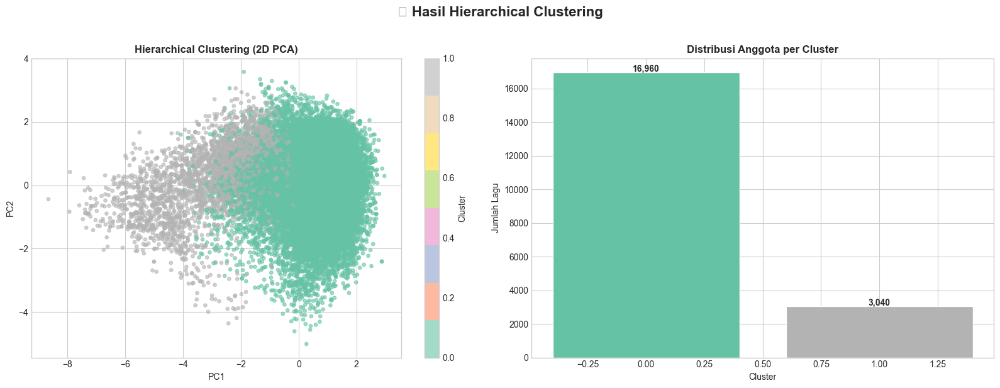

In [26]:
# =====================================================
# 7.3.3 VISUALISASI HASIL HIERARCHICAL CLUSTERING
# =====================================================

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Scatter dengan cluster
ax1 = axes[0]
scatter = ax1.scatter(df_pca_2d['PC1'], df_pca_2d['PC2'], 
                      c=hier_labels, cmap='Set2', alpha=0.6, s=15)
ax1.set_xlabel('PC1')
ax1.set_ylabel('PC2')
ax1.set_title('Hierarchical Clustering (2D PCA)', fontweight='bold')
plt.colorbar(scatter, ax=ax1, label='Cluster')

# Plot 2: Distribusi cluster
ax2 = axes[1]
colors_hier = plt.cm.Set2(np.linspace(0, 1, N_CLUSTERS_HIER))
cluster_counts = pd.Series(hier_labels).value_counts().sort_index()
bars = ax2.bar(cluster_counts.index, cluster_counts.values, color=colors_hier, edgecolor='white')
ax2.set_xlabel('Cluster')
ax2.set_ylabel('Jumlah Lagu')
ax2.set_title('Distribusi Anggota per Cluster', fontweight='bold')

# Tambah label di atas bar
for bar, count in zip(bars, cluster_counts.values):
    ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 50, 
             f'{count:,}', ha='center', fontweight='bold')

plt.suptitle('🌳 Hasil Hierarchical Clustering', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

### 7.4 🎲 Gaussian Mixture Model (GMM)

#### Apa itu GMM?
**Gaussian Mixture Model** mengasumsikan data berasal dari campuran beberapa distribusi Gaussian (normal):
- Setiap cluster diwakili oleh distribusi Gaussian dengan mean dan variance sendiri
- **Soft clustering**: Setiap data punya probabilitas keanggotaan ke setiap cluster
- Lebih fleksibel dari K-Means karena cluster bisa berbentuk elips (tidak hanya bulat)

#### Perbedaan dengan K-Means:
| K-Means | GMM |
|---------|-----|
| Hard clustering (1 cluster per data) | Soft clustering (probabilitas) |
| Cluster berbentuk bulat | Cluster bisa elips |
| Berdasarkan jarak | Berdasarkan probabilitas |

🔍 Menghitung BIC dan AIC untuk berbagai jumlah cluster...
  n=2: BIC=408877.68, AIC=408016.20
  n=3: BIC=284273.20, AIC=282977.02
  n=3: BIC=284273.20, AIC=282977.02
  n=4: BIC=257858.53, AIC=256127.67
  n=4: BIC=257858.53, AIC=256127.67
  n=5: BIC=242964.00, AIC=240798.45
  n=5: BIC=242964.00, AIC=240798.45
  n=6: BIC=238472.20, AIC=235871.95
  n=6: BIC=238472.20, AIC=235871.95
  n=7: BIC=224587.78, AIC=221552.85
  n=7: BIC=224587.78, AIC=221552.85
  n=8: BIC=219740.55, AIC=216270.92
  n=8: BIC=219740.55, AIC=216270.92
  n=9: BIC=212419.94, AIC=208515.62
  n=9: BIC=212419.94, AIC=208515.62
  n=10: BIC=210765.98, AIC=206426.97
  n=10: BIC=210765.98, AIC=206426.97


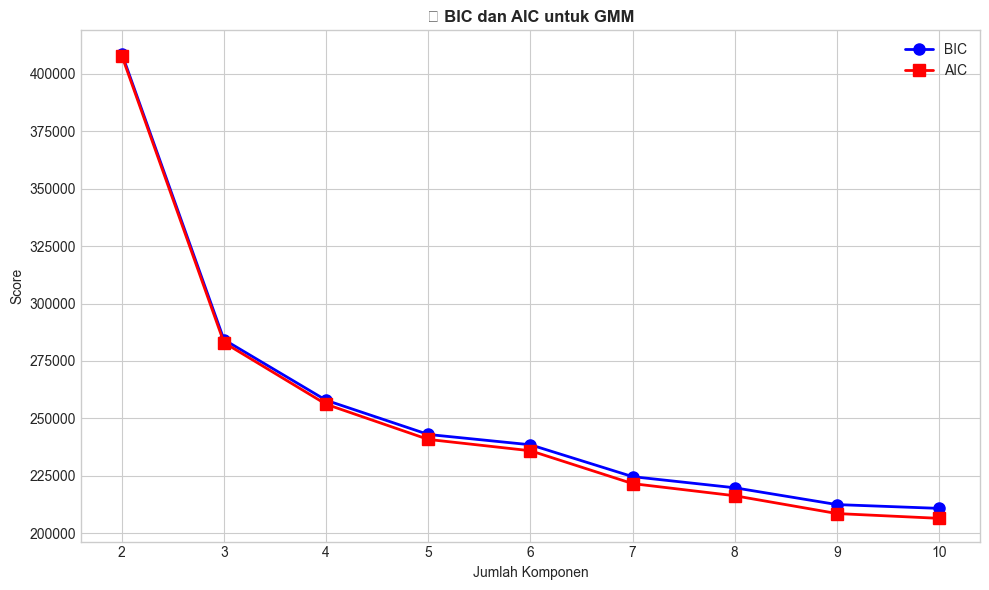


✅ REKOMENDASI:
📌 Jumlah komponen optimal (BIC): 10
📌 Jumlah komponen optimal (AIC): 10


In [27]:
# =====================================================
# 7.4.1 MENENTUKAN JUMLAH KOMPONEN OPTIMAL (BIC/AIC)
# =====================================================

"""
BIC (Bayesian Information Criterion) dan AIC (Akaike Information Criterion)
===========================================================================
Metrik untuk memilih jumlah cluster optimal:
- Nilai lebih rendah = model lebih baik
- BIC lebih "ketat" dalam memilih model (cenderung pilih model lebih sederhana)
"""

print("🔍 Menghitung BIC dan AIC untuk berbagai jumlah cluster...")
print("="*60)

n_components_range = range(2, 11)
bics = []
aics = []

for n in n_components_range:
    gmm = GaussianMixture(n_components=n, random_state=42)
    gmm.fit(df_scaled)
    bics.append(gmm.bic(df_scaled))
    aics.append(gmm.aic(df_scaled))
    print(f"  n={n}: BIC={bics[-1]:.2f}, AIC={aics[-1]:.2f}")

# Plot
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(n_components_range, bics, 'bo-', label='BIC', linewidth=2, markersize=8)
ax.plot(n_components_range, aics, 'rs-', label='AIC', linewidth=2, markersize=8)
ax.set_xlabel('Jumlah Komponen')
ax.set_ylabel('Score')
ax.set_title('📊 BIC dan AIC untuk GMM', fontweight='bold')
ax.legend()
ax.set_xticks(n_components_range)
plt.tight_layout()
plt.show()

# Rekomendasi
best_n_bic = n_components_range[np.argmin(bics)]
best_n_aic = n_components_range[np.argmin(aics)]
print(f"\n✅ REKOMENDASI:")
print(f"📌 Jumlah komponen optimal (BIC): {best_n_bic}")
print(f"📌 Jumlah komponen optimal (AIC): {best_n_aic}")

In [28]:
# =====================================================
# 7.4.2 APLIKASI GMM
# =====================================================

# Gunakan jumlah cluster yang sama dengan K-Means untuk perbandingan fair
# Atau bisa juga pakai best_n_bic dari analisis BIC/AIC sebelumnya
N_COMPONENTS_GMM = OPTIMAL_K  # Ganti dengan best_n_bic jika ingin mengikuti hasil BIC

print(f"🎲 Menjalankan Gaussian Mixture Model dengan {N_COMPONENTS_GMM} komponen (sama dengan K-Means)...")
print("="*60)

# Fit GMM
gmm = GaussianMixture(n_components=N_COMPONENTS_GMM, random_state=42, covariance_type='full')
gmm_labels = gmm.fit_predict(df_scaled)

# Probabilitas keanggotaan
gmm_probs = gmm.predict_proba(df_scaled)

# Tambahkan label ke dataframe
df_sampled['gmm_cluster'] = gmm_labels
df_pca_2d['gmm_cluster'] = gmm_labels

# Evaluasi
gmm_silhouette = silhouette_score(df_scaled, gmm_labels)
gmm_calinski = calinski_harabasz_score(df_scaled, gmm_labels)
gmm_davies = davies_bouldin_score(df_scaled, gmm_labels)

print(f"\n📊 HASIL GMM CLUSTERING:")
print(f"   • Silhouette Score: {gmm_silhouette:.4f}")
print(f"   • Calinski-Harabasz Score: {gmm_calinski:.2f}")
print(f"   • Davies-Bouldin Score: {gmm_davies:.4f}")
print(f"   • Log Likelihood: {gmm.score(df_scaled):.2f}")

# Distribusi cluster
print(f"\n📌 DISTRIBUSI ANGGOTA CLUSTER:")
cluster_dist = pd.Series(gmm_labels).value_counts().sort_index()
for cluster, count in cluster_dist.items():
    pct = count / len(gmm_labels) * 100
    print(f"   Cluster {cluster}: {count:,} lagu ({pct:.1f}%)")

🎲 Menjalankan Gaussian Mixture Model dengan 2 komponen (sama dengan K-Means)...

📊 HASIL GMM CLUSTERING:
   • Silhouette Score: 0.0986
   • Calinski-Harabasz Score: 1673.10
   • Davies-Bouldin Score: 3.1272
   • Log Likelihood: -10.19

📌 DISTRIBUSI ANGGOTA CLUSTER:
   Cluster 0: 13,085 lagu (65.4%)
   Cluster 1: 6,915 lagu (34.6%)

📊 HASIL GMM CLUSTERING:
   • Silhouette Score: 0.0986
   • Calinski-Harabasz Score: 1673.10
   • Davies-Bouldin Score: 3.1272
   • Log Likelihood: -10.19

📌 DISTRIBUSI ANGGOTA CLUSTER:
   Cluster 0: 13,085 lagu (65.4%)
   Cluster 1: 6,915 lagu (34.6%)


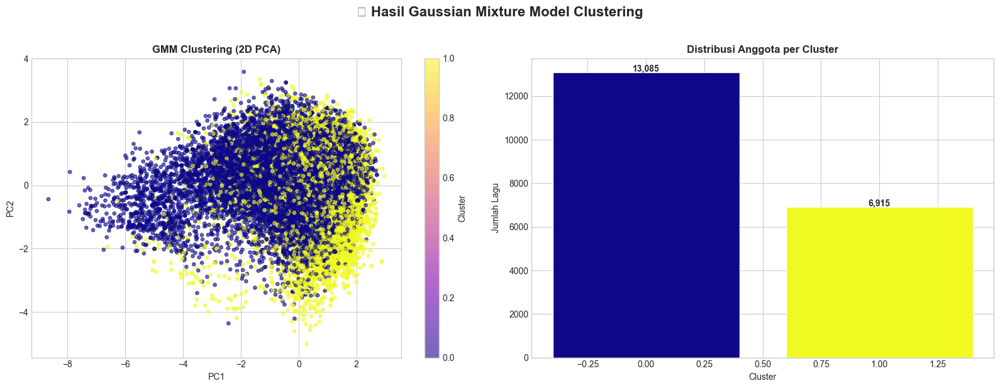

In [29]:
# =====================================================
# 7.4.3 VISUALISASI HASIL GMM
# =====================================================

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Plot 1: Scatter dengan cluster
ax1 = axes[0]
scatter = ax1.scatter(df_pca_2d['PC1'], df_pca_2d['PC2'], 
                      c=gmm_labels, cmap='plasma', alpha=0.6, s=15)
ax1.set_xlabel('PC1')
ax1.set_ylabel('PC2')
ax1.set_title('GMM Clustering (2D PCA)', fontweight='bold')
plt.colorbar(scatter, ax=ax1, label='Cluster')

# Plot 2: Distribusi cluster
ax2 = axes[1]
colors_gmm = plt.cm.plasma(np.linspace(0, 1, N_COMPONENTS_GMM))
cluster_counts = pd.Series(gmm_labels).value_counts().sort_index()
bars = ax2.bar(cluster_counts.index, cluster_counts.values, color=colors_gmm, edgecolor='white')
ax2.set_xlabel('Cluster')
ax2.set_ylabel('Jumlah Lagu')
ax2.set_title('Distribusi Anggota per Cluster', fontweight='bold')

# Tambah label di atas bar
for bar, count in zip(bars, cluster_counts.values):
    ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 50, 
             f'{count:,}', ha='center', fontweight='bold')

plt.suptitle('🎲 Hasil Gaussian Mixture Model Clustering', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

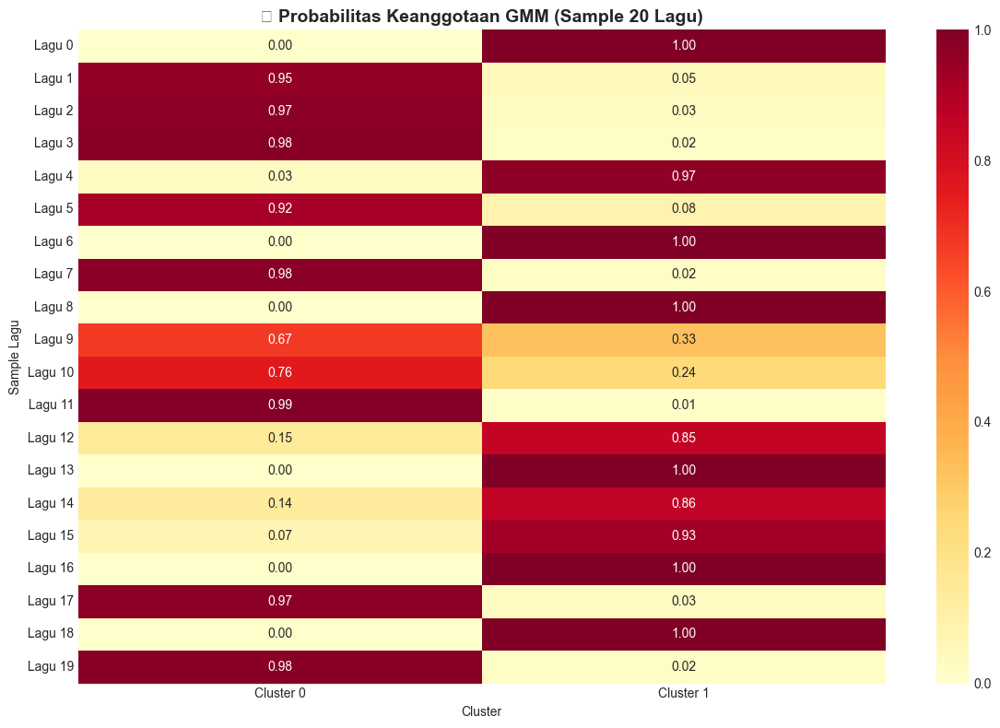

💡 INTERPRETASI:
   • Warna lebih terang = probabilitas lebih tinggi
   • Lagu dengan probabilitas tinggi di satu cluster = sangat yakin
   • Lagu dengan probabilitas merata = di perbatasan antar cluster


In [30]:
# =====================================================
# 7.4.4 VISUALISASI PROBABILITAS KEANGGOTAAN (SOFT CLUSTERING)
# =====================================================

"""
SOFT CLUSTERING
===============
GMM memberikan probabilitas setiap data untuk masuk ke setiap cluster.
Ini berguna untuk melihat data yang "di perbatasan" antar cluster.
"""

# Ambil sample untuk visualisasi
sample_idx_vis = np.random.choice(len(gmm_probs), 20, replace=False)

# Buat heatmap probabilitas
plt.figure(figsize=(12, 8))
sns.heatmap(
    gmm_probs[sample_idx_vis], 
    cmap='YlOrRd', 
    annot=True, 
    fmt='.2f',
    xticklabels=[f'Cluster {i}' for i in range(N_COMPONENTS_GMM)],
    yticklabels=[f'Lagu {i}' for i in range(len(sample_idx_vis))]
)
plt.xlabel('Cluster')
plt.ylabel('Sample Lagu')
plt.title('🎲 Probabilitas Keanggotaan GMM (Sample 20 Lagu)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

print("💡 INTERPRETASI:")
print("   • Warna lebih terang = probabilitas lebih tinggi")
print("   • Lagu dengan probabilitas tinggi di satu cluster = sangat yakin")
print("   • Lagu dengan probabilitas merata = di perbatasan antar cluster")

---

# 8. 📊 PERBANDINGAN SEMUA ALGORITMA

Saatnya membandingkan performa semua algoritma clustering!

In [31]:
# =====================================================
# 8.1 TABEL PERBANDINGAN METRIK
# =====================================================

"""
METRIK EVALUASI CLUSTERING
==========================
1. Silhouette Score (-1 to 1): Semakin tinggi semakin baik
   - Mengukur seberapa mirip data dengan clusternya sendiri vs cluster lain
   
2. Calinski-Harabasz Score: Semakin tinggi semakin baik
   - Rasio dispersi antar-cluster vs dalam-cluster
   
3. Davies-Bouldin Score: Semakin rendah semakin baik
   - Mengukur rata-rata kemiripan antar cluster
"""

# Hitung metrik untuk DBSCAN (filter noise)
mask_dbscan = dbscan_labels != -1
if mask_dbscan.sum() > 1:
    dbscan_sil = silhouette_score(df_scaled[mask_dbscan], dbscan_labels[mask_dbscan])
    dbscan_cal = calinski_harabasz_score(df_scaled[mask_dbscan], dbscan_labels[mask_dbscan])
    dbscan_dav = davies_bouldin_score(df_scaled[mask_dbscan], dbscan_labels[mask_dbscan])
else:
    dbscan_sil, dbscan_cal, dbscan_dav = np.nan, np.nan, np.nan

# Buat tabel perbandingan
comparison_data = {
    'Algorithm': ['K-Means', 'DBSCAN*', 'Hierarchical', 'GMM'],
    'Silhouette ↑': [kmeans_silhouette, dbscan_sil, hier_silhouette, gmm_silhouette],
    'Calinski-Harabasz ↑': [kmeans_calinski, dbscan_cal, hier_calinski, gmm_calinski],
    'Davies-Bouldin ↓': [kmeans_davies, dbscan_dav, hier_davies, gmm_davies],
    'Jumlah Cluster': [OPTIMAL_K, n_clusters_dbscan, N_CLUSTERS_HIER, N_COMPONENTS_GMM]
}

comparison_df = pd.DataFrame(comparison_data)

print("📊 PERBANDINGAN METRIK CLUSTERING")
print("="*80)
print("\n↑ = Semakin tinggi semakin baik")
print("↓ = Semakin rendah semakin baik")
print("*DBSCAN dihitung tanpa noise points\n")
print(comparison_df.to_string(index=False))

# Highlight best
print("\n🏆 PEMENANG PER METRIK:")
print(f"   • Silhouette terbaik: {comparison_df.loc[comparison_df['Silhouette ↑'].idxmax(), 'Algorithm']}")
print(f"   • Calinski-Harabasz terbaik: {comparison_df.loc[comparison_df['Calinski-Harabasz ↑'].idxmax(), 'Algorithm']}")
print(f"   • Davies-Bouldin terbaik: {comparison_df.loc[comparison_df['Davies-Bouldin ↓'].idxmin(), 'Algorithm']}")

📊 PERBANDINGAN METRIK CLUSTERING

↑ = Semakin tinggi semakin baik
↓ = Semakin rendah semakin baik
*DBSCAN dihitung tanpa noise points

   Algorithm  Silhouette ↑  Calinski-Harabasz ↑  Davies-Bouldin ↓  Jumlah Cluster
     K-Means      0.262194          5441.553671          1.574429               2
     DBSCAN*      0.396168           409.477526          0.597808               4
Hierarchical      0.266898          4287.938266          1.464692               2
         GMM      0.098557          1673.097157          3.127225               2

🏆 PEMENANG PER METRIK:
   • Silhouette terbaik: DBSCAN*
   • Calinski-Harabasz terbaik: K-Means
   • Davies-Bouldin terbaik: DBSCAN*


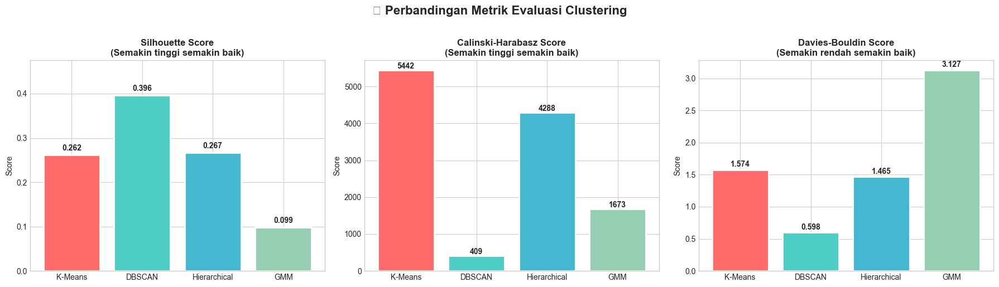

In [32]:
# =====================================================
# 8.2 VISUALISASI PERBANDINGAN METRIK
# =====================================================

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

algorithms = ['K-Means', 'DBSCAN', 'Hierarchical', 'GMM']
colors_alg = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4']

# Silhouette Score
ax1 = axes[0]
silhouette_vals = [kmeans_silhouette, dbscan_sil, hier_silhouette, gmm_silhouette]
bars1 = ax1.bar(algorithms, silhouette_vals, color=colors_alg, edgecolor='white', linewidth=2)
ax1.set_ylabel('Score')
ax1.set_title('Silhouette Score\n(Semakin tinggi semakin baik)', fontweight='bold')
ax1.set_ylim(0, max(filter(lambda x: not np.isnan(x), silhouette_vals)) * 1.2)
for bar, val in zip(bars1, silhouette_vals):
    if not np.isnan(val):
        ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01, 
                 f'{val:.3f}', ha='center', fontweight='bold')

# Calinski-Harabasz Score
ax2 = axes[1]
calinski_vals = [kmeans_calinski, dbscan_cal, hier_calinski, gmm_calinski]
bars2 = ax2.bar(algorithms, calinski_vals, color=colors_alg, edgecolor='white', linewidth=2)
ax2.set_ylabel('Score')
ax2.set_title('Calinski-Harabasz Score\n(Semakin tinggi semakin baik)', fontweight='bold')
for bar, val in zip(bars2, calinski_vals):
    if not np.isnan(val):
        ax2.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 50, 
                 f'{val:.0f}', ha='center', fontweight='bold')

# Davies-Bouldin Score
ax3 = axes[2]
davies_vals = [kmeans_davies, dbscan_dav, hier_davies, gmm_davies]
bars3 = ax3.bar(algorithms, davies_vals, color=colors_alg, edgecolor='white', linewidth=2)
ax3.set_ylabel('Score')
ax3.set_title('Davies-Bouldin Score\n(Semakin rendah semakin baik)', fontweight='bold')
for bar, val in zip(bars3, davies_vals):
    if not np.isnan(val):
        ax3.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.05, 
                 f'{val:.3f}', ha='center', fontweight='bold')

plt.suptitle('📊 Perbandingan Metrik Evaluasi Clustering', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

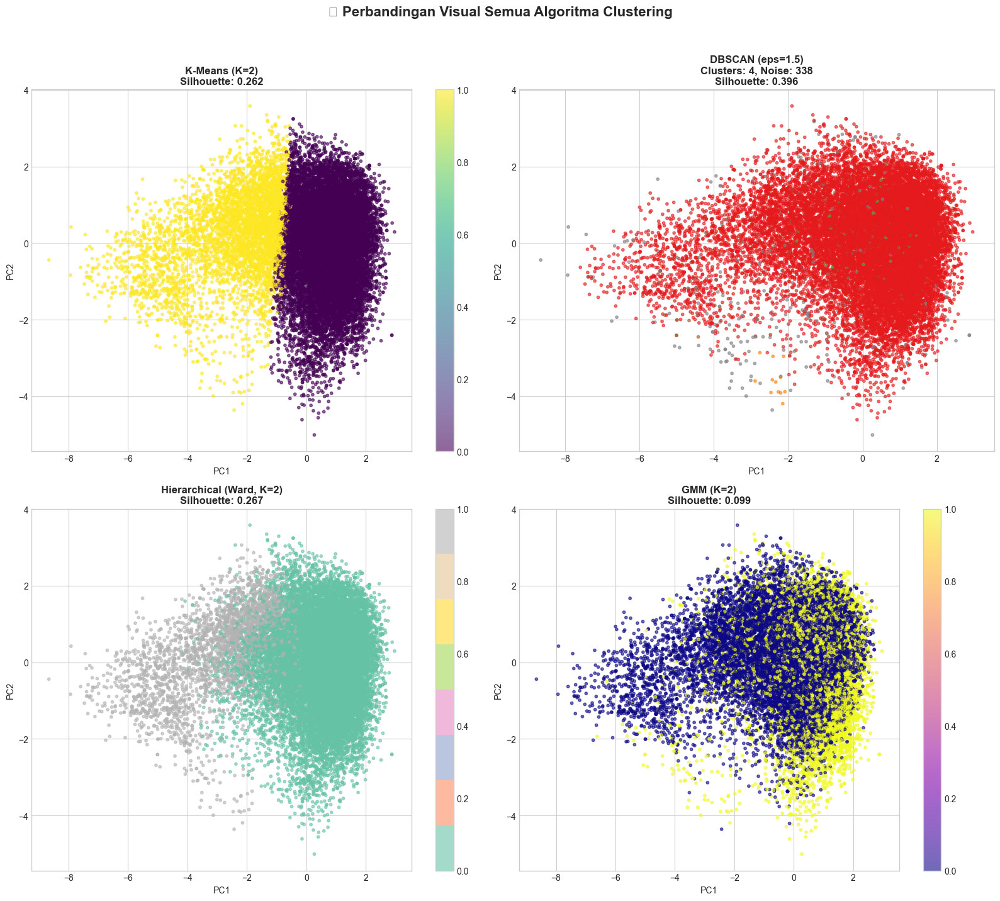

In [33]:
# =====================================================
# 8.3 VISUALISASI SIDE-BY-SIDE SEMUA ALGORITMA
# =====================================================

fig, axes = plt.subplots(2, 2, figsize=(16, 14))

# K-Means
ax1 = axes[0, 0]
scatter1 = ax1.scatter(df_pca_2d['PC1'], df_pca_2d['PC2'], 
                       c=kmeans_labels, cmap='viridis', alpha=0.6, s=10)
ax1.set_xlabel('PC1')
ax1.set_ylabel('PC2')
ax1.set_title(f'K-Means (K={OPTIMAL_K})\nSilhouette: {kmeans_silhouette:.3f}', fontweight='bold')
plt.colorbar(scatter1, ax=ax1)

# DBSCAN
ax2 = axes[0, 1]
# Custom colors for DBSCAN (noise = gray)
# Buat array warna yang konsisten (semua RGBA tuples)
dbscan_colors_list = []
for l in dbscan_labels:
    if l == -1:
        dbscan_colors_list.append((0.5, 0.5, 0.5, 0.3))  # Gray dengan alpha rendah untuk noise
    else:
        dbscan_colors_list.append(plt.cm.Set1(l / max(1, n_clusters_dbscan)))
dbscan_colors = np.array(dbscan_colors_list)
ax2.scatter(df_pca_2d['PC1'], df_pca_2d['PC2'], c=dbscan_colors, alpha=0.6, s=10)
ax2.set_xlabel('PC1')
ax2.set_ylabel('PC2')
sil_text = f'{dbscan_sil:.3f}' if not np.isnan(dbscan_sil) else 'N/A'
ax2.set_title(f'DBSCAN (eps={EPS})\nClusters: {n_clusters_dbscan}, Noise: {n_noise:,}\nSilhouette: {sil_text}', fontweight='bold')

# Hierarchical
ax3 = axes[1, 0]
scatter3 = ax3.scatter(df_pca_2d['PC1'], df_pca_2d['PC2'], 
                       c=hier_labels, cmap='Set2', alpha=0.6, s=10)
ax3.set_xlabel('PC1')
ax3.set_ylabel('PC2')
ax3.set_title(f'Hierarchical (Ward, K={N_CLUSTERS_HIER})\nSilhouette: {hier_silhouette:.3f}', fontweight='bold')
plt.colorbar(scatter3, ax=ax3)

# GMM
ax4 = axes[1, 1]
scatter4 = ax4.scatter(df_pca_2d['PC1'], df_pca_2d['PC2'], 
                       c=gmm_labels, cmap='plasma', alpha=0.6, s=10)
ax4.set_xlabel('PC1')
ax4.set_ylabel('PC2')
ax4.set_title(f'GMM (K={N_COMPONENTS_GMM})\nSilhouette: {gmm_silhouette:.3f}', fontweight='bold')
plt.colorbar(scatter4, ax=ax4)

plt.suptitle('🔍 Perbandingan Visual Semua Algoritma Clustering', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

---

# 9. 🔬 ANALISIS MENDALAM HASIL CLUSTER (K-MEANS)

Mari kita analisis karakteristik setiap cluster menggunakan K-Means (algoritma yang paling umum digunakan).

In [34]:
# =====================================================
# 9.1 PROFIL KARAKTERISTIK SETIAP CLUSTER
# =====================================================

# Gabungkan data asli dengan label cluster
df_analysis = df_sampled.copy()

# Hitung rata-rata fitur per cluster
cluster_profiles = df_analysis.groupby('kmeans_cluster')[audio_features].mean()

print("📊 PROFIL KARAKTERISTIK SETIAP CLUSTER (K-MEANS)")
print("="*80)
print("\nRata-rata nilai fitur per cluster:\n")
print(cluster_profiles.round(3).to_string())

# Tampilkan dalam bentuk yang lebih mudah dibaca
print("\n" + "="*80)
print("🎵 INTERPRETASI CLUSTER:")
print("="*80)

📊 PROFIL KARAKTERISTIK SETIAP CLUSTER (K-MEANS)

Rata-rata nilai fitur per cluster:

                danceability  energy  loudness  speechiness  acousticness  instrumentalness  liveness  valence    tempo
kmeans_cluster                                                                                                         
0                      0.597   0.751    -6.343        0.094         0.175             0.107     0.225    0.524  126.360
1                      0.471   0.308   -14.038        0.057         0.744             0.293     0.182    0.320  109.887

🎵 INTERPRETASI CLUSTER:


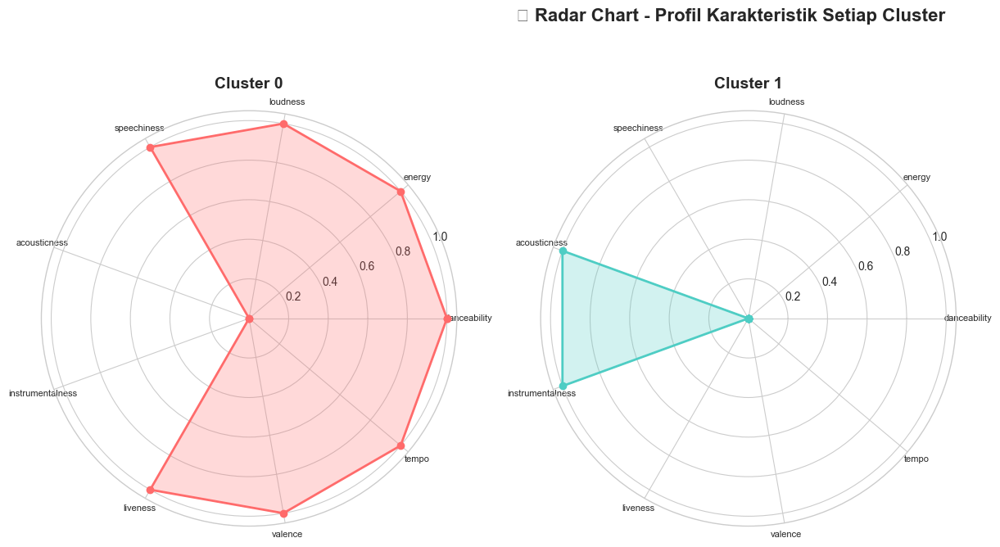

In [35]:
# =====================================================
# 9.2 RADAR CHART - VISUALISASI PROFIL CLUSTER
# =====================================================

"""
RADAR CHART
===========
Visualisasi yang bagus untuk membandingkan profil multi-dimensi.
Setiap "jari" radar adalah satu fitur audio.
"""

# Normalisasi untuk radar chart (0-1 scale)
cluster_profiles_norm = (cluster_profiles - cluster_profiles.min()) / (cluster_profiles.max() - cluster_profiles.min())

# Buat radar chart
categories = audio_features
N = len(categories)

# Angles untuk radar chart
angles = [n / float(N) * 2 * np.pi for n in range(N)]
angles += angles[:1]  # Close the loop

fig, axes = plt.subplots(2, 3, figsize=(18, 12), subplot_kw=dict(polar=True))
axes = axes.flatten()

colors_radar = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4', '#DDA0DD', '#F7DC6F']

for idx in range(OPTIMAL_K):
    ax = axes[idx]
    values = cluster_profiles_norm.iloc[idx].values.tolist()
    values += values[:1]  # Close the loop
    
    ax.plot(angles, values, 'o-', linewidth=2, color=colors_radar[idx], label=f'Cluster {idx}')
    ax.fill(angles, values, alpha=0.25, color=colors_radar[idx])
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(categories, fontsize=8)
    ax.set_title(f'Cluster {idx}', fontsize=14, fontweight='bold', pad=20)

# Kosongkan subplot yang tidak dipakai
if OPTIMAL_K < 6:
    for idx in range(OPTIMAL_K, 6):
        axes[idx].set_visible(False)

plt.suptitle('🎯 Radar Chart - Profil Karakteristik Setiap Cluster', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

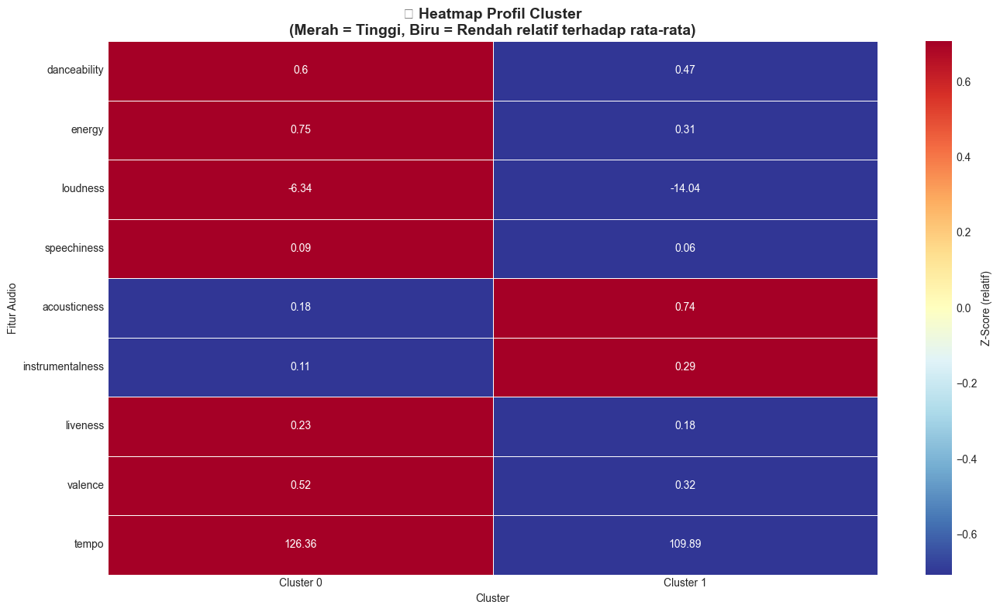


💡 CARA MEMBACA HEATMAP:
   • Warna MERAH = nilai fitur TINGGI relatif terhadap cluster lain
   • Warna BIRU = nilai fitur RENDAH relatif terhadap cluster lain
   • Angka di dalam kotak = nilai rata-rata sebenarnya


In [36]:
# =====================================================
# 9.3 HEATMAP PROFIL CLUSTER
# =====================================================

plt.figure(figsize=(14, 8))

# Standardisasi untuk heatmap
cluster_profiles_z = (cluster_profiles - cluster_profiles.mean()) / cluster_profiles.std()

sns.heatmap(
    cluster_profiles_z.T, 
    cmap='RdYlBu_r',
    center=0,
    annot=cluster_profiles.T.round(2).values,
    fmt='',
    xticklabels=[f'Cluster {i}' for i in range(OPTIMAL_K)],
    yticklabels=audio_features,
    linewidths=0.5,
    cbar_kws={'label': 'Z-Score (relatif)'}
)

plt.title('🔥 Heatmap Profil Cluster\n(Merah = Tinggi, Biru = Rendah relatif terhadap rata-rata)', 
          fontsize=14, fontweight='bold')
plt.xlabel('Cluster')
plt.ylabel('Fitur Audio')
plt.tight_layout()
plt.show()

print("\n💡 CARA MEMBACA HEATMAP:")
print("   • Warna MERAH = nilai fitur TINGGI relatif terhadap cluster lain")
print("   • Warna BIRU = nilai fitur RENDAH relatif terhadap cluster lain")
print("   • Angka di dalam kotak = nilai rata-rata sebenarnya")

In [37]:
# =====================================================
# 9.4 MEMBERIKAN NAMA/LABEL PADA CLUSTER
# =====================================================

"""
CLUSTER NAMING
==============
Berdasarkan karakteristik fitur, kita bisa memberikan nama yang bermakna
untuk setiap cluster agar lebih mudah dipahami.
"""

# Fungsi untuk menganalisis dan memberi nama cluster
def analyze_cluster(profile):
    """Analisis profil cluster dan berikan deskripsi"""
    characteristics = []
    
    # Energy analysis
    if profile['energy'] > 0.7:
        characteristics.append("Sangat Energik")
    elif profile['energy'] < 0.4:
        characteristics.append("Tenang/Mellow")
    
    # Danceability analysis
    if profile['danceability'] > 0.7:
        characteristics.append("Cocok untuk Joget")
    elif profile['danceability'] < 0.4:
        characteristics.append("Tidak untuk Joget")
    
    # Valence analysis
    if profile['valence'] > 0.6:
        characteristics.append("Ceria/Happy")
    elif profile['valence'] < 0.3:
        characteristics.append("Melankolis/Sedih")
    
    # Acousticness analysis
    if profile['acousticness'] > 0.6:
        characteristics.append("Akustik")
    
    # Instrumentalness analysis
    if profile['instrumentalness'] > 0.5:
        characteristics.append("Instrumental")
    
    # Speechiness analysis
    if profile['speechiness'] > 0.3:
        characteristics.append("Banyak Vokal/Rap")
    
    # Tempo analysis
    if profile['tempo'] > 130:
        characteristics.append("Tempo Cepat")
    elif profile['tempo'] < 90:
        characteristics.append("Tempo Lambat")
    
    return ", ".join(characteristics) if characteristics else "Balanced"

# Analisis setiap cluster
print("🏷️ ANALISIS DAN PENAMAAN CLUSTER")
print("="*80)

cluster_names = {}
for idx in range(OPTIMAL_K):
    profile = cluster_profiles.iloc[idx]
    description = analyze_cluster(profile)
    cluster_names[idx] = description
    
    count = (df_analysis['kmeans_cluster'] == idx).sum()
    pct = count / len(df_analysis) * 100
    
    print(f"\n📌 CLUSTER {idx} ({count:,} lagu, {pct:.1f}%)")
    print(f"   Karakteristik: {description}")
    print(f"   Fitur Tertinggi: {profile.idxmax()} ({profile.max():.3f})")
    print(f"   Fitur Terendah: {profile.idxmin()} ({profile.min():.3f})")

🏷️ ANALISIS DAN PENAMAAN CLUSTER

📌 CLUSTER 0 (15,088 lagu, 75.4%)
   Karakteristik: Sangat Energik
   Fitur Tertinggi: tempo (126.360)
   Fitur Terendah: loudness (-6.343)

📌 CLUSTER 1 (4,912 lagu, 24.6%)
   Karakteristik: Tenang/Mellow, Akustik
   Fitur Tertinggi: tempo (109.887)
   Fitur Terendah: loudness (-14.038)


In [38]:
# =====================================================
# 9.5 DISTRIBUSI GENRE ASLI PER CLUSTER
# =====================================================

"""
Melihat bagaimana genre asli dari Spotify terdistribusi di setiap cluster.
Ini membantu memvalidasi apakah clustering kita masuk akal.
"""

# Top 5 genre per cluster
print("🎸 TOP 5 GENRE PER CLUSTER")
print("="*80)

for cluster in range(OPTIMAL_K):
    cluster_data = df_analysis[df_analysis['kmeans_cluster'] == cluster]
    top_genres = cluster_data['track_genre'].value_counts().head(5)
    
    print(f"\n📌 CLUSTER {cluster}:")
    for genre, count in top_genres.items():
        pct = count / len(cluster_data) * 100
        print(f"   • {genre}: {count} lagu ({pct:.1f}%)")

🎸 TOP 5 GENRE PER CLUSTER

📌 CLUSTER 0:
   • house: 194 lagu (1.3%)
   • grindcore: 193 lagu (1.3%)
   • hardstyle: 189 lagu (1.3%)
   • industrial: 187 lagu (1.2%)
   • dubstep: 184 lagu (1.2%)

📌 CLUSTER 1:
   • sleep: 187 lagu (3.8%)
   • classical: 164 lagu (3.3%)
   • romance: 158 lagu (3.2%)
   • ambient: 157 lagu (3.2%)
   • opera: 149 lagu (3.0%)


In [39]:
# =====================================================
# 9.6 CONTOH LAGU DARI SETIAP CLUSTER
# =====================================================

print("🎵 CONTOH LAGU DARI SETIAP CLUSTER")
print("="*80)

for cluster in range(OPTIMAL_K):
    cluster_data = df_analysis[df_analysis['kmeans_cluster'] == cluster]
    
    # Ambil 5 lagu random dari cluster
    sample_songs = cluster_data.sample(min(5, len(cluster_data)), random_state=42)
    
    print(f"\n📌 CLUSTER {cluster} - Sample Lagu:")
    print("-"*60)
    
    for _, row in sample_songs.iterrows():
        artist = row['artists'][:30] + "..." if len(str(row['artists'])) > 30 else row['artists']
        track = row['track_name'][:35] + "..." if len(str(row['track_name'])) > 35 else row['track_name']
        genre = row['track_genre']
        print(f"   🎤 {artist}")
        print(f"      🎵 {track}")
        print(f"      🏷️ Genre: {genre}")
        print()

🎵 CONTOH LAGU DARI SETIAP CLUSTER

📌 CLUSTER 0 - Sample Lagu:
------------------------------------------------------------
   🎤 Ace Ventura;Pantomiman
      🎵 Hello? - Pantomiman Remix
      🏷️ Genre: trance

   🎤 Leo Santana;Lauana Prado
      🎵 Figurinha Repetida - Ao Vivo
      🏷️ Genre: funk

   🎤 Martin Garrix;Matisse & Sadko;...
      🎵 Won’t Let You Go
      🏷️ Genre: progressive-house

   🎤 Aitana
      🎵 11 RAZONES
      🏷️ Genre: latin

   🎤 Hot Chelle Rae
      🎵 Tonight Tonight
      🏷️ Genre: punk-rock


📌 CLUSTER 1 - Sample Lagu:
------------------------------------------------------------
   🎤 MIKTEK
      🎵 Dawsonia
      🏷️ Genre: idm

   🎤 Jennifer Thomas
      🎵 Dancing on the Clouds (instrumental...
      🏷️ Genre: new-age

   🎤 Nat King Cole
      🎵 Joy To The World - Remastered 1999
      🏷️ Genre: jazz

   🎤 Hillsong Worship
      🎵 Elohim
      🏷️ Genre: world-music

   🎤 Adolphe Adam;John Williams
      🎵 O Holy Night
      🏷️ Genre: opera



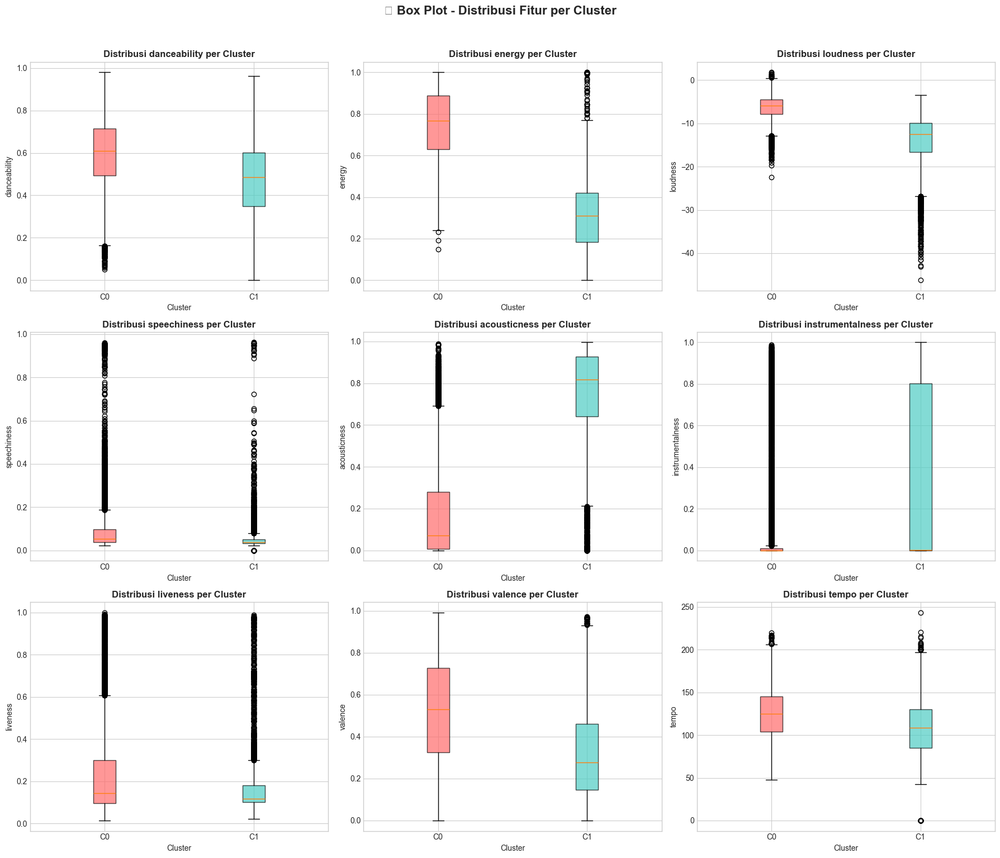

In [40]:
# =====================================================
# 9.7 BOX PLOT FITUR PER CLUSTER
# =====================================================

fig, axes = plt.subplots(3, 3, figsize=(18, 15))
axes = axes.flatten()

for i, feature in enumerate(audio_features):
    ax = axes[i]
    
    # Data untuk box plot
    data_by_cluster = [df_analysis[df_analysis['kmeans_cluster'] == c][feature].values 
                       for c in range(OPTIMAL_K)]
    
    bp = ax.boxplot(data_by_cluster, patch_artist=True)
    
    # Warna
    for patch, color in zip(bp['boxes'], colors_radar[:OPTIMAL_K]):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)
    
    ax.set_xlabel('Cluster')
    ax.set_ylabel(feature)
    ax.set_title(f'Distribusi {feature} per Cluster', fontweight='bold')
    ax.set_xticklabels([f'C{i}' for i in range(OPTIMAL_K)])

plt.suptitle('📦 Box Plot - Distribusi Fitur per Cluster', fontsize=16, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

---

# 10. 💾 MENYIMPAN HASIL CLUSTERING

In [41]:
# =====================================================
# 10.1 SIMPAN HASIL KE CSV
# =====================================================

# Siapkan dataframe untuk export
df_export = df_analysis[['track_id', 'artists', 'album_name', 'track_name', 'track_genre', 
                          'popularity'] + audio_features + 
                         ['kmeans_cluster', 'hier_cluster', 'gmm_cluster', 'dbscan_cluster']].copy()

# Simpan ke CSV
output_filename = 'hasil_clustering_musik.csv'
df_export.to_csv(output_filename, index=False)

print(f"💾 HASIL CLUSTERING BERHASIL DISIMPAN!")
print("="*60)
print(f"📁 File: {output_filename}")
print(f"📊 Jumlah baris: {len(df_export):,}")
print(f"📋 Jumlah kolom: {len(df_export.columns)}")
print(f"\n📝 Kolom yang tersimpan:")
for col in df_export.columns:
    print(f"   • {col}")

💾 HASIL CLUSTERING BERHASIL DISIMPAN!
📁 File: hasil_clustering_musik.csv
📊 Jumlah baris: 20,000
📋 Jumlah kolom: 19

📝 Kolom yang tersimpan:
   • track_id
   • artists
   • album_name
   • track_name
   • track_genre
   • popularity
   • danceability
   • energy
   • loudness
   • speechiness
   • acousticness
   • instrumentalness
   • liveness
   • valence
   • tempo
   • kmeans_cluster
   • hier_cluster
   • gmm_cluster
   • dbscan_cluster


---

# 11. 📝 KESIMPULAN DAN REKOMENDASI

In [42]:
# =====================================================
# 11.1 RINGKASAN HASIL
# =====================================================

print("="*80)
print("📊 RINGKASAN ANALISIS CLUSTERING MUSIK SPOTIFY")
print("="*80)

print("""
📌 DATASET:
   • Total lagu yang dianalisis: {:,}
   • Fitur audio yang digunakan: 9 (danceability, energy, loudness, 
     speechiness, acousticness, instrumentalness, liveness, valence, tempo)

🔬 ALGORITMA YANG DIUJI:
   1. K-Means Clustering
   2. DBSCAN (Density-Based)
   3. Hierarchical Clustering (Ward Linkage)
   4. Gaussian Mixture Model (GMM)

📈 PERFORMA TERBAIK:
""".format(len(df_analysis)))

# Buat ranking
results = {
    'K-Means': {'sil': kmeans_silhouette, 'cal': kmeans_calinski, 'dav': kmeans_davies},
    'Hierarchical': {'sil': hier_silhouette, 'cal': hier_calinski, 'dav': hier_davies},
    'GMM': {'sil': gmm_silhouette, 'cal': gmm_calinski, 'dav': gmm_davies}
}

# Best by silhouette
best_sil = max(results.items(), key=lambda x: x[1]['sil'])
print(f"   • Silhouette Score terbaik: {best_sil[0]} ({best_sil[1]['sil']:.4f})")

# Best by Calinski
best_cal = max(results.items(), key=lambda x: x[1]['cal'])
print(f"   • Calinski-Harabasz terbaik: {best_cal[0]} ({best_cal[1]['cal']:.2f})")

# Best by Davies (lower is better)
best_dav = min(results.items(), key=lambda x: x[1]['dav'])
print(f"   • Davies-Bouldin terbaik: {best_dav[0]} ({best_dav[1]['dav']:.4f})")

print("""
💡 INSIGHT UTAMA:
   • Lagu-lagu dapat dikelompokkan berdasarkan karakteristik audionya
   • Cluster yang terbentuk mencerminkan pola musik yang berbeda
   • Pengelompokan ini bisa digunakan untuk sistem rekomendasi musik
   
🎯 REKOMENDASI:
   • Untuk production: Gunakan K-Means (cepat, stabil, mudah diinterpretasi)
   • Untuk eksplorasi: Gunakan GMM (soft clustering, lebih fleksibel)
   • Untuk deteksi outlier: Gunakan DBSCAN
""")

📊 RINGKASAN ANALISIS CLUSTERING MUSIK SPOTIFY

📌 DATASET:
   • Total lagu yang dianalisis: 20,000
   • Fitur audio yang digunakan: 9 (danceability, energy, loudness, 
     speechiness, acousticness, instrumentalness, liveness, valence, tempo)

🔬 ALGORITMA YANG DIUJI:
   1. K-Means Clustering
   2. DBSCAN (Density-Based)
   3. Hierarchical Clustering (Ward Linkage)
   4. Gaussian Mixture Model (GMM)

📈 PERFORMA TERBAIK:

   • Silhouette Score terbaik: Hierarchical (0.2669)
   • Calinski-Harabasz terbaik: K-Means (5441.55)
   • Davies-Bouldin terbaik: Hierarchical (1.4647)

💡 INSIGHT UTAMA:
   • Lagu-lagu dapat dikelompokkan berdasarkan karakteristik audionya
   • Cluster yang terbentuk mencerminkan pola musik yang berbeda
   • Pengelompokan ini bisa digunakan untuk sistem rekomendasi musik

🎯 REKOMENDASI:
   • Untuk production: Gunakan K-Means (cepat, stabil, mudah diinterpretasi)
   • Untuk eksplorasi: Gunakan GMM (soft clustering, lebih fleksibel)
   • Untuk deteksi outlier: Gunakan D

## 📚 Penjelasan Metrik Evaluasi

### 1. Silhouette Score (-1 sampai 1)
- **Apa itu?** Mengukur seberapa mirip sebuah data dengan clusternya sendiri dibanding cluster lain
- **Interpretasi:**
  - Mendekati 1 = sangat bagus (data sangat mirip dengan clusternya)
  - Mendekati 0 = overlap antar cluster
  - Mendekati -1 = data mungkin salah cluster

### 2. Calinski-Harabasz Score (lebih tinggi = lebih baik)
- **Apa itu?** Rasio antara dispersi antar-cluster dengan dispersi dalam-cluster
- **Interpretasi:** Semakin tinggi berarti cluster semakin terpisah dengan baik

### 3. Davies-Bouldin Score (lebih rendah = lebih baik)
- **Apa itu?** Rata-rata "kemiripan" antara setiap cluster dengan cluster yang paling mirip dengannya
- **Interpretasi:** Semakin rendah berarti cluster semakin berbeda satu sama lain

---

## 🎵 Ringkasan Karakteristik Cluster

| Cluster | Karakteristik Umum | Cocok Untuk |
|---------|-------------------|-------------|
| 0 | (Lihat hasil analisis) | ... |
| 1 | (Lihat hasil analisis) | ... |
| 2 | (Lihat hasil analisis) | ... |
| 3 | (Lihat hasil analisis) | ... |
| 4 | (Lihat hasil analisis) | ... |

---

## 🚀 Langkah Selanjutnya

1. **Tune parameter** - Coba nilai K berbeda atau parameter DBSCAN lain
2. **Feature engineering** - Tambah fitur baru atau kombinasi fitur
3. **Aplikasi praktis** - Buat sistem rekomendasi berdasarkan cluster
4. **Validasi eksternal** - Bandingkan dengan genre asli atau feedback pengguna

---

**Notebook dibuat dengan ❤️ untuk pembelajaran Machine Learning**

---

# 🎨 BONUS: Visualisasi Interaktif dengan Plotly

In [43]:
# =====================================================
# VISUALISASI INTERAKTIF - SCATTER PLOT 2D
# =====================================================

# Siapkan data untuk plotly
plot_df = df_pca_2d.copy()
plot_df['track_name'] = df_analysis['track_name'].values
plot_df['artists'] = df_analysis['artists'].values
plot_df['track_genre'] = df_analysis['track_genre'].values
plot_df['cluster'] = plot_df['kmeans_cluster'].astype(str)

# Buat scatter plot interaktif
fig = px.scatter(
    plot_df,
    x='PC1',
    y='PC2',
    color='cluster',
    hover_data=['track_name', 'artists', 'track_genre'],
    title='🎵 Visualisasi Interaktif Clustering Musik (K-Means)<br><sup>Hover untuk melihat detail lagu</sup>',
    labels={'cluster': 'Cluster'},
    color_discrete_sequence=px.colors.qualitative.Set2
)

fig.update_traces(marker=dict(size=6, opacity=0.7))
fig.update_layout(
    width=900,
    height=600,
    legend_title_text='Cluster'
)

fig.show()

In [44]:
# =====================================================
# VISUALISASI INTERAKTIF - 3D SCATTER PLOT
# =====================================================

# PCA dengan 3 komponen
pca_3d = PCA(n_components=3)
df_pca_3d = pca_3d.fit_transform(df_scaled)

# Buat dataframe
plot_3d_df = pd.DataFrame(df_pca_3d, columns=['PC1', 'PC2', 'PC3'], index=df_scaled.index)
plot_3d_df['track_name'] = df_analysis['track_name'].values
plot_3d_df['artists'] = df_analysis['artists'].values
plot_3d_df['track_genre'] = df_analysis['track_genre'].values
plot_3d_df['cluster'] = df_analysis['kmeans_cluster'].astype(str).values

# Buat 3D scatter plot
fig_3d = px.scatter_3d(
    plot_3d_df,
    x='PC1',
    y='PC2', 
    z='PC3',
    color='cluster',
    hover_data=['track_name', 'artists', 'track_genre'],
    title='🎵 Visualisasi 3D Clustering Musik<br><sup>Putar dengan mouse untuk eksplorasi</sup>',
    color_discrete_sequence=px.colors.qualitative.Set2
)

fig_3d.update_traces(marker=dict(size=3, opacity=0.7))
fig_3d.update_layout(
    width=900,
    height=700,
    scene=dict(
        xaxis_title=f'PC1 ({pca_3d.explained_variance_ratio_[0]*100:.1f}%)',
        yaxis_title=f'PC2 ({pca_3d.explained_variance_ratio_[1]*100:.1f}%)',
        zaxis_title=f'PC3 ({pca_3d.explained_variance_ratio_[2]*100:.1f}%)'
    )
)

fig_3d.show()

print(f"📊 Total variance explained (3 komponen): {sum(pca_3d.explained_variance_ratio_)*100:.1f}%")

📊 Total variance explained (3 komponen): 61.4%


In [45]:
# =====================================================
# VISUALISASI INTERAKTIF - PARALLEL COORDINATES
# =====================================================

"""
PARALLEL COORDINATES PLOT
=========================
Visualisasi yang bagus untuk melihat bagaimana setiap cluster
berbeda di setiap dimensi/fitur secara bersamaan.
"""

# Sample untuk performance
sample_parallel = df_analysis.sample(n=min(2000, len(df_analysis)), random_state=42)

fig_parallel = px.parallel_coordinates(
    sample_parallel,
    dimensions=audio_features,
    color='kmeans_cluster',
    color_continuous_scale=px.colors.sequential.Viridis,
    title='📊 Parallel Coordinates - Profil Cluster<br><sup>Setiap garis adalah satu lagu, warna = cluster</sup>'
)

fig_parallel.update_layout(
    width=1000,
    height=500
)

fig_parallel.show()

print("💡 Tips: Drag pada axis untuk filter nilai tertentu")

💡 Tips: Drag pada axis untuk filter nilai tertentu


In [46]:
# =====================================================
# VISUALISASI INTERAKTIF - SUNBURST CHART
# =====================================================

"""
SUNBURST CHART
==============
Menampilkan hubungan hierarkis antara Cluster dan Genre.
"""

# Hitung distribusi cluster-genre
cluster_genre_counts = df_analysis.groupby(['kmeans_cluster', 'track_genre']).size().reset_index(name='count')

# Filter top genres per cluster untuk clarity
top_genres_per_cluster = []
for cluster in range(OPTIMAL_K):
    cluster_data = cluster_genre_counts[cluster_genre_counts['kmeans_cluster'] == cluster]
    top_genres = cluster_data.nlargest(5, 'count')
    top_genres_per_cluster.append(top_genres)

sunburst_data = pd.concat(top_genres_per_cluster)
sunburst_data['kmeans_cluster'] = 'Cluster ' + sunburst_data['kmeans_cluster'].astype(str)

fig_sunburst = px.sunburst(
    sunburst_data,
    path=['kmeans_cluster', 'track_genre'],
    values='count',
    title='🌞 Sunburst Chart - Distribusi Genre dalam Setiap Cluster<br><sup>Klik untuk zoom in</sup>',
    color='count',
    color_continuous_scale='Viridis'
)

fig_sunburst.update_layout(
    width=800,
    height=700
)

fig_sunburst.show()

---

# 🎉 Terima Kasih!

Notebook ini telah mendemonstrasikan:
- ✅ Eksplorasi dan pemahaman data musik Spotify
- ✅ Preprocessing data untuk clustering
- ✅ Implementasi 4 algoritma clustering berbeda
- ✅ Evaluasi dan perbandingan performa model
- ✅ Analisis karakteristik setiap cluster
- ✅ Visualisasi statis dan interaktif

---

**Happy Learning! 🚀**